In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import numpy as np
import cv2
from tqdm import tqdm
import json 

import torch
from torch.utils.data import DataLoader
from torchvision import models
from torchsummary import summary

import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau, MultiStepLR
from torch.utils.data import random_split
import torch.optim as optim


from torchsummary import summary
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
import os
import shutil
import pandas as pd
from PIL import Image


In [ ]:
!unzip /content/drive/MyDrive/dataset.zip

In [3]:
train = pd.read_csv("/content/trainData.csv")
test  = pd.read_csv("/content/testData.csv")

In [4]:
test

,Unnamed: 0,path
0,0,val_3760.JPEG
1,1,val_9503.JPEG
2,2,val_6330.JPEG
3,3,val_8698.JPEG
4,4,val_9229.JPEG
...,...,...
1295,1295,val_530.JPEG
1296,1296,val_8006.JPEG
1297,1297,val_1986.JPEG
1298,1298,val_9934.JPEG


In [5]:
class CustomDataset(Dataset):

    def __init__(self, data, train):
        
        self.data = data
        self.train = train
        self.transform = transforms.Compose([transforms.ToTensor()])

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        
        row1 = self.data.iloc[idx,:]
        path1 = row1["path"]
        secondIdx = idx+1

        if self.train == 0:
            if idx == 0 or idx == 1:
                secondIdx = idx + 1
            if idx == 5000 or idx == 4999:
                secondIdx = idx - 1
        else:
            if idx == 0 or idx == 1:
                secondIdx = idx + 1
            if idx == 1300 or idx == 1299:
                secondIdx = idx - 1
        
        #print(secondIdx)
        row2 = self.data.iloc[secondIdx,:]
        path2 = row2["path"]

        if self.train == 0:
            idx1Path = "/content/train/" + path1
            idx2Path = "/content/train/" + path2
        else:
            idx1Path = "/content/test/" + path1
            idx2Path = "/content/test/" + path2

        img1 = Image.open(idx1Path)
        img2 = Image.open(idx2Path)
        img1 = np.float32(img1)
        img2 = np.float32(img2)

        if img1.shape[-1] != 3:
            img1 = np.stack((img1,)*3, axis=-1)

        if img2.shape[-1] != 3:
            img2 = np.stack((img2,)*3, axis=-1)
        
        # Permuting the images as per pytorch
        img1 = np.transpose(img1, (2, 1, 0))
        img2 = np.transpose(img2, (2, 1, 0))

        img1 = (img1 - img1.min()) / (img1.max() - img1.min())
        img2 = (img2 - img2.min()) / (img2.max() - img2.min())

        return img1, img2

In [6]:
trainData = CustomDataset(train, 0)
valData = CustomDataset(test, 1)

print("Train Dataset Length : ", len(trainData))
print("Validation Dataset Length : ", len(valData))

Train Dataset Length :  5000
Validation Dataset Length :  1300


In [7]:
SHUFFLE = True
RANDOM_SEED = 10
BATCH_SIZE = 32

trainLoader = DataLoader(trainData, BATCH_SIZE, shuffle=True, num_workers=0)
valLoader = DataLoader(valData,BATCH_SIZE,shuffle=True, num_workers=0)

train_on_gpu = torch.cuda.is_available()
device =  torch.device('cuda' if torch.cuda.is_available else 'cpu')
print(device)


cuda


In [8]:
print("Train Loader Summary")
print("Total Batches : ", len(trainLoader), "     Total Images : ", len(trainLoader.sampler))
print("=================================================")
print("Val Loader Summary")
print("Total Batches : ", len(valLoader), "      Total Images : ", len(valLoader.sampler))

Train Loader Summary
Total Batches :  157      Total Images :  5000
Val Loader Summary
Total Batches :  41       Total Images :  1300


In [9]:
class StegNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        
        # Encoder Down Blocks
        self.encoderDownBlock1 = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(32),
            nn.LeakyReLU(inplace=True),
        )

        self.encoderDownBlock2 = nn.Sequential(
            nn.Conv2d(32, 128, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(128),
            nn.LeakyReLU(inplace=True),
        )

        self.encoderDownBlock3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(256),
            nn.LeakyReLU(inplace=True),
        )

        # Encoder Up Blocks
        self.encoderUpBlock1 = nn.Sequential(
            nn.Conv2d(256 + 128, 128, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(128),
            nn.LeakyReLU(inplace=True),
        )

        self.encoderUpBlock2 = nn.Sequential(
            nn.Conv2d(128+ 32, 32, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(32),
            nn.LeakyReLU(inplace=True),
        )

        self.encoderUpBlock3 = nn.Sequential(
            nn.Conv2d(32 + 6, 3, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.Tanh(),
        )
        

        # Decoder Blocks
        self.decoderDownBlock1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(32),
            nn.LeakyReLU(inplace=True),
        )

        self.decoderDownBlock2 = nn.Sequential(
            nn.Conv2d(32, 128, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(128),
            nn.LeakyReLU(inplace=True),
        )

        self.decoderDownBlock3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(256),
            nn.LeakyReLU(inplace=True),
        )

        # Encoder Up Blocks
        self.decoderUpBlock1 = nn.Sequential(
            nn.Conv2d(256 + 128, 128, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(128),
            nn.LeakyReLU(inplace=True),
        )

        self.decoderUpBlock2 = nn.Sequential(
            nn.Conv2d(128+ 32, 32, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(32),
            nn.LeakyReLU(inplace=True),
        )

        self.decoderUpBlock3 = nn.Sequential(
            nn.Conv2d(32 + 3, 3, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.Sigmoid(),
        )


    def forward(self, img1, img2):

        # ================================================================== #
        # merged image
        mergedImages = torch.cat((img1, img2), dim=1)
        #print("Merged Images Dimension      : ", mergedImages.shape)

        # Encoder DownBlocks
        encoderDownBlock1 = self.encoderDownBlock1(mergedImages)
        #print("encoderDownBlock1 Dimension  : ", encoderDownBlock1.shape)

        encoderDownBlock2 = self.encoderDownBlock2(encoderDownBlock1)
        #print("encoderDownBlock2 Dimension  : ", encoderDownBlock2.shape)
        
        encoderDownBlock3 = self.encoderDownBlock3(encoderDownBlock2)
        #print("encoderDownBlock3 Dimension  : ", encoderDownBlock3.shape)

        # Encoder UpBlocks
        concat_EDB3_EDB2 = torch.cat((encoderDownBlock3, encoderDownBlock2), dim=1)
        encoderUpBlock1 = self.encoderUpBlock1(concat_EDB3_EDB2)
        #print("encoderUpBlock1 Dimension  : ", encoderUpBlock1.shape)

        concat_EUB1_EDB1 = torch.cat((encoderUpBlock1, encoderDownBlock1), dim=1)
        encoderUpBlock2 = self.encoderUpBlock2(concat_EUB1_EDB1)
        #print("encoderUpBlock2 Dimension  : ", encoderUpBlock2.shape)

        concat_EUB2_mergedImages = torch.cat((encoderUpBlock2, mergedImages), dim=1)
        encoderUpBlock3 = self.encoderUpBlock3(concat_EUB2_mergedImages)
        #print("encoderUpBlock3 Dimension  : ", encoderUpBlock3.shape)

        # ================================================================== #
        # coder DownBlocks
        decoderDownBlock1 = self.decoderDownBlock1(encoderUpBlock3)
        #print("decoderDownBlock1 Dimension  : ", decoderDownBlock1.shape)

        decoderDownBlock2 = self.decoderDownBlock2(decoderDownBlock1)
        #print("decoderDownBlock2 Dimension  : ", decoderDownBlock2.shape)
        
        decoderDownBlock3 = self.decoderDownBlock3(decoderDownBlock2)
        #print("decoderDownBlock3 Dimension  : ", decoderDownBlock3.shape)

        # Encoder UpBlocks
        concat_DDB3_DDB2 = torch.cat((decoderDownBlock3, decoderDownBlock2), dim=1)
        decoderUpBlock1 = self.decoderUpBlock1(concat_DDB3_DDB2)
        #print("decoderUpBlock1 Dimension  : ", decoderUpBlock1.shape)

        concat_DUB1_DDB1 = torch.cat((decoderUpBlock1, decoderDownBlock1), dim=1)
        decoderUpBlock2 = self.decoderUpBlock2(concat_DUB1_DDB1)
        #print("decoderUpBlock2 Dimension  : ", decoderUpBlock2.shape)

        concat_DUB2_steg = torch.cat((decoderUpBlock2, encoderUpBlock3), dim=1)
        decoderUpBlock3 = self.decoderUpBlock3(concat_DUB2_steg)
        #print("decoderUpBlock3 Dimension  : ", decoderUpBlock3.shape)

        # retrun stegImg, reconstructedImg
        return encoderUpBlock3, decoderUpBlock3

In [10]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=1, features=[32, 64, 128, 256]):
        super().__init__()

        self.discriminator1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(32),
            nn.LeakyReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        self.discriminator2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(64),
            nn.LeakyReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        self.discriminator3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(128),
            nn.LeakyReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        self.discriminator4 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(128),
            nn.LeakyReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        self.discriminator5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.InstanceNorm3d(256),
            nn.LeakyReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        self.discriminator6 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, padding_mode="reflect"),
            nn.Sigmoid(),
        )

    def forward(self, x):


        x = self.discriminator1(x)
        x = self.discriminator2(x)
        x = self.discriminator3(x)
        x = self.discriminator4(x)
        x = self.discriminator5(x)
        x = self.discriminator6(x)

        # 256 * 8 * 8
        print("Here", x.shape)
        return x


In [11]:
# discriminator = Discriminator()#.to(device)
# summary(discriminator, (3, 64, 64))

In [12]:
# gen = StegNetwork()#.to(device)
# summary(gen, [(3, 64, 64), (3,64,64)])

In [13]:
train_on_gpu = True
if train_on_gpu:
    device = "cuda"
else:
    device = "cpu"

In [14]:
generator = StegNetwork().to(device)
discriminator = Discriminator().to(device)
generator.load_state_dict(torch.load("/content/drive/MyDrive/SecurityResearchResults/generator.pt"), strict=False)
discriminator.load_state_dict(torch.load("/content/drive/MyDrive/SecurityResearchResults/discriminator.pt"), strict=False)

<All keys matched successfully>

In [ ]:
#summary(model, [(64, 64, 3), (64, 64, 3)])

In [ ]:
opt_disc = optim.Adam(
        list(discriminator.parameters()),
        lr=0.0001,
        betas=(0.5, 0.999),
    )

opt_gen = optim.Adam(
    list(generator.parameters()),
    lr=0.0001,
    betas=(0.5, 0.999),
)

In [ ]:
mse = nn.MSELoss()
l1= nn.L1Loss()
bce = nn.BCELoss()

In [ ]:
dictTrain = {
    "GeneratorLoss" : [],
    "DiscriminatorLoss" : [],
    "GL" : [],
    "coverImageSimLoss" : [],
    "reconLoss" : [],
    "G2Loss" : [],
    "CycleI1Loss" : [],
    "CycleI2Loss" : [],
    "PsnrLossI1" : [],
    "PsnrLossI2" : [],
    "GlobalDiscLossI1" : [],
    "GlobalDiscLossI2" : []
}

In [ ]:
import json
  
f = open('/content/drive/MyDrive/SecurityResearchResults/dictTrain.json')
dictTrain = json.load(f)

In [ ]:
genLoss = []
genLossGL = []
genLossCISim = []
genLossRecon = []
disLoss = []

sumGen = 0
sumDis = 0
sumGenGL = 0
sumGenCISim = 0
sumGenRecon = 0

for i in range(len(dictTrain["GeneratorLoss"])):
    
    if i % 157 == 0 and i != 0:
        genLoss.append(sumGen/157)
        genLossGL.append(sumGenGL/157)
        genLossCISim.append(sumGenCISim/157)
        genLossRecon.append(sumGenRecon/157)
        disLoss.append(sumDis/157)


        sumGen = 0
        sumDis = 0
        sumGenGL = 0
        sumGenCISim = 0
        sumGenRecon = 0

    else:
        sumGen += dictTrain["GeneratorLoss"][i]
        sumDis += dictTrain["DiscriminatorLoss"][i]
        sumGenGL += dictTrain["GL"][i]
        sumGenCISim += dictTrain["coverImageSimLoss"][i]   
        sumGenRecon += dictTrain["reconLoss"][i]


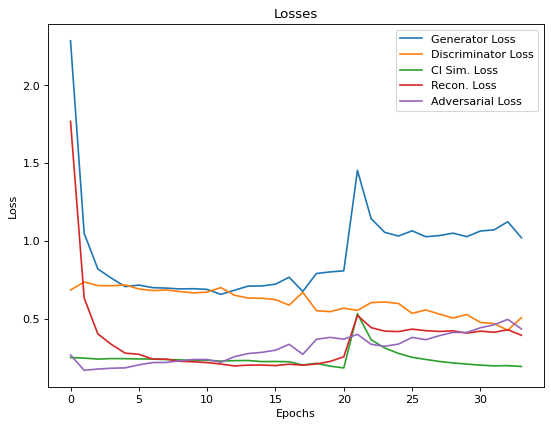

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(8, 6), dpi=80)

plt.plot(np.arange(len(genLoss)), genLoss, label = "Generator Loss")
plt.plot(np.arange(len(disLoss)), disLoss, label = "Discriminator Loss")
plt.plot(np.arange(len(genLossCISim)), genLossCISim, label = "CI Sim. Loss")
plt.plot(np.arange(len(genLossRecon)), genLossRecon, label = "Recon. Loss")
plt.plot(np.arange(len(genLossGL)), genLossGL, label = "Adversarial Loss")
plt.title("Losses")
plt.xlabel("Epochs")
plt.ylabel("Loss")

plt.legend()
plt.show()

## Training loop 

Training


0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  1 Batch Id :  0
Train GLoss      :  0.6524986028671265
Train CISim      :  0.2484433352947235
Train GL         :  0.030231330543756485
Train reconLoss  :  0.37382394075393677
Train DLoss :  0.947002112865448
StegImage Shape :  0.9919778 0.0
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96932924 0.0055182055


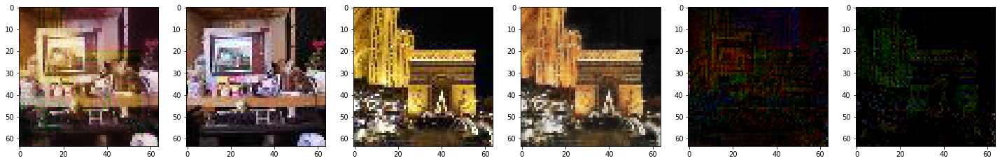

20it [00:11,  1.82it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  1 Batch Id :  20
Train GLoss      :  1.3229238986968994
Train CISim      :  0.19480925798416138
Train GL         :  0.7846328020095825
Train reconLoss  :  0.34348180890083313
Train DLoss :  0.4923483431339264
StegImage Shape :  1.0 0.0073293424
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.95915043 0.027264286


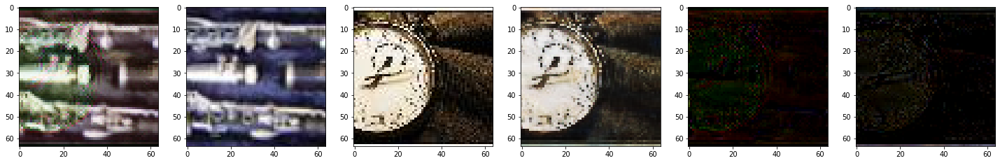

40it [00:23,  1.82it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  1 Batch Id :  40
Train GLoss      :  1.1245551109313965
Train CISim      :  0.17796985805034637
Train GL         :  0.6119745969772339
Train reconLoss  :  0.3346106708049774
Train DLoss :  0.537575900554657
StegImage Shape :  0.97316486 0.040420804
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94411075 0.030313894


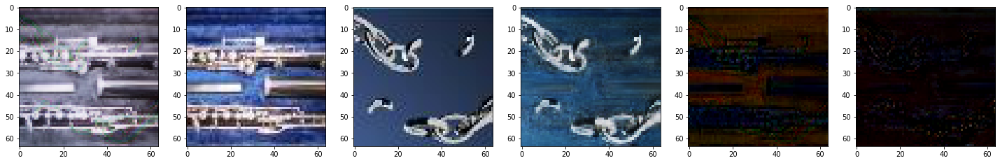

60it [00:35,  1.80it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  1 Batch Id :  60
Train GLoss      :  0.952207088470459
Train CISim      :  0.2364303171634674
Train GL         :  0.3527621626853943
Train reconLoss  :  0.3630146086215973
Train DLoss :  0.5000718832015991
StegImage Shape :  0.9972942 0.0053252517
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9819109 0.0048657083


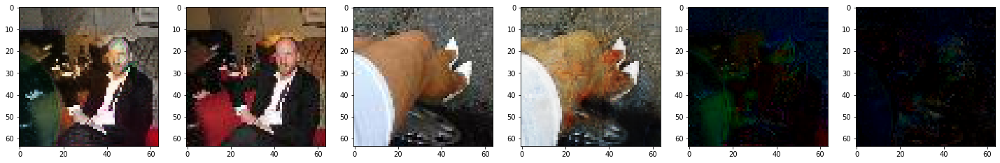

80it [00:47,  1.79it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  1 Batch Id :  80
Train GLoss      :  1.0883733034133911
Train CISim      :  0.20287960767745972
Train GL         :  0.5500063896179199
Train reconLoss  :  0.3354873061180115
Train DLoss :  0.4688057005405426
StegImage Shape :  0.9946469 0.013510675
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9545122 0.008135271


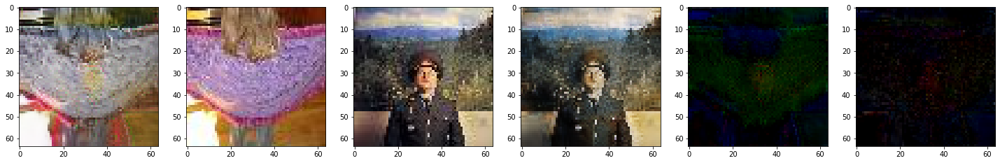

100it [00:59,  1.78it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  1 Batch Id :  100
Train GLoss      :  0.6898959875106812
Train CISim      :  0.20487594604492188
Train GL         :  0.11743590235710144
Train reconLoss  :  0.36758410930633545
Train DLoss :  0.8662146329879761
StegImage Shape :  0.99303275 0.0025063336
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98011935 0.019301953


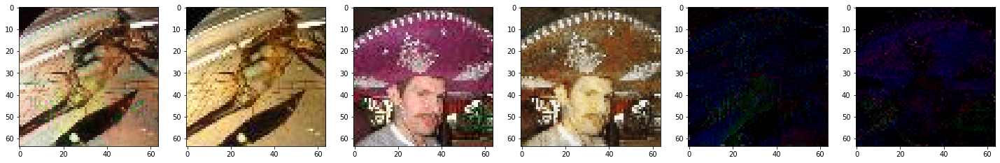

120it [01:11,  1.77it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  1 Batch Id :  120
Train GLoss      :  1.2410953044891357
Train CISim      :  0.23437052965164185
Train GL         :  0.6048274040222168
Train reconLoss  :  0.4018973708152771
Train DLoss :  0.4592793881893158
StegImage Shape :  0.9743004 0.047308158
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9874008 0.060155414


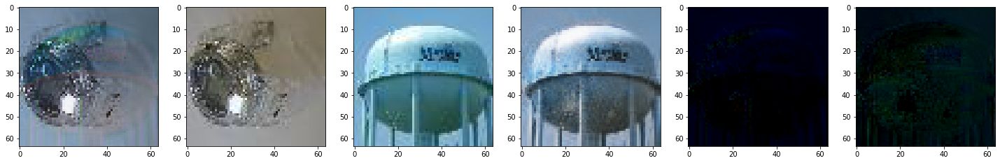

140it [01:23,  1.76it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  1 Batch Id :  140
Train GLoss      :  1.3784704208374023
Train CISim      :  0.21671965718269348
Train GL         :  0.7891623377799988
Train reconLoss  :  0.37258845567703247
Train DLoss :  0.3415250778198242
StegImage Shape :  0.99241143 0.010205036
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9596036 0.020181114


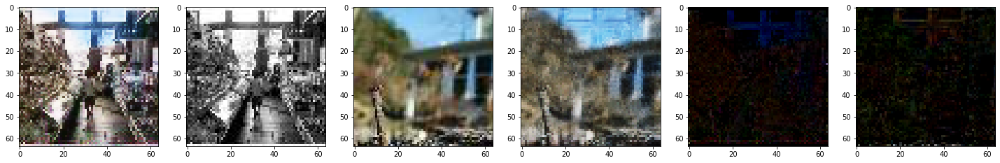

157it [01:33,  1.68it/s]



Epoch No. : 1 

Training Loss Generator : 1.02621 
Training Loss Discriminator : 0.52562 


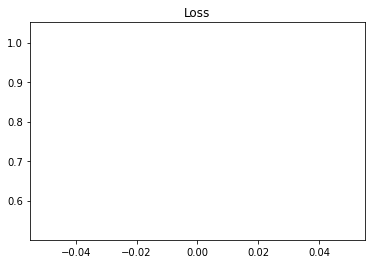


Validation loss decreased : inf ===> 0.59038061
Saving Model!
Training


0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  2 Batch Id :  0
Train GLoss      :  1.2264375686645508
Train CISim      :  0.16547395288944244
Train GL         :  0.6186730265617371
Train reconLoss  :  0.44229060411453247
Train DLoss :  0.4305676519870758
StegImage Shape :  0.98970723 0.011548844
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9981194 0.018791357


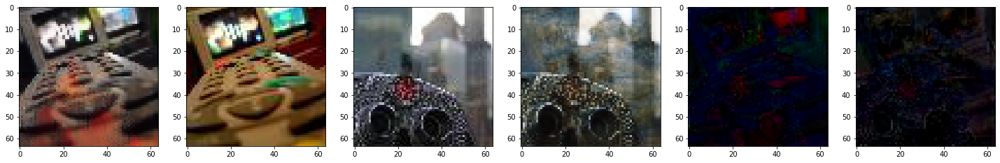

20it [00:12,  1.75it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  2 Batch Id :  20
Train GLoss      :  1.0810770988464355
Train CISim      :  0.21690911054611206
Train GL         :  0.4463065564632416
Train reconLoss  :  0.4178614616394043
Train DLoss :  0.3418753743171692
StegImage Shape :  0.987833 0.0111868465
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.968648 0.030672306


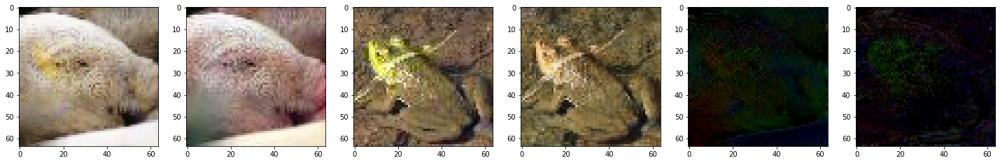

40it [00:24,  1.74it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  2 Batch Id :  40
Train GLoss      :  1.2191957235336304
Train CISim      :  0.2185380458831787
Train GL         :  0.623225212097168
Train reconLoss  :  0.3774324953556061
Train DLoss :  0.39832136034965515
StegImage Shape :  0.9790425 0.004623893
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9381629 0.04420846


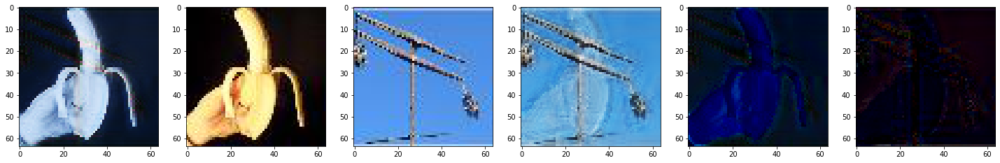

60it [00:36,  1.74it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  2 Batch Id :  60
Train GLoss      :  1.2823851108551025
Train CISim      :  0.2375677227973938
Train GL         :  0.6583923101425171
Train reconLoss  :  0.38642507791519165
Train DLoss :  0.3233552575111389
StegImage Shape :  0.99269253 0.02448919
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96930325 0.048741326


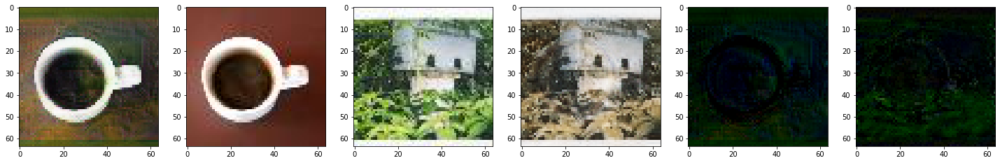

80it [00:48,  1.73it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  2 Batch Id :  80
Train GLoss      :  0.6013005375862122
Train CISim      :  0.18551163375377655
Train GL         :  0.02151736617088318
Train reconLoss  :  0.3942715525627136
Train DLoss :  0.943011999130249
StegImage Shape :  0.99144536 0.0063271374
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97125804 0.0071846256


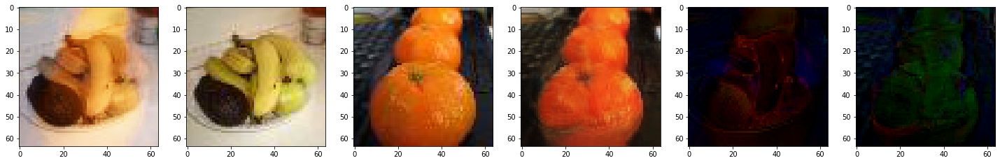

100it [01:00,  1.73it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  2 Batch Id :  100
Train GLoss      :  1.0831509828567505
Train CISim      :  0.1865992248058319
Train GL         :  0.45267724990844727
Train reconLoss  :  0.44387444853782654
Train DLoss :  0.4103159010410309
StegImage Shape :  0.9902153 0.009654663
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98040307 0.007313339


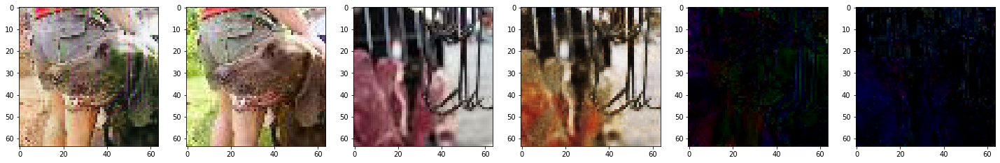

120it [01:12,  1.72it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  2 Batch Id :  120
Train GLoss      :  1.3906687498092651
Train CISim      :  0.17017516493797302
Train GL         :  0.6248759031295776
Train reconLoss  :  0.5956177115440369
Train DLoss :  0.45859983563423157
StegImage Shape :  0.9924724 0.009805288
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9393479 0.04045297


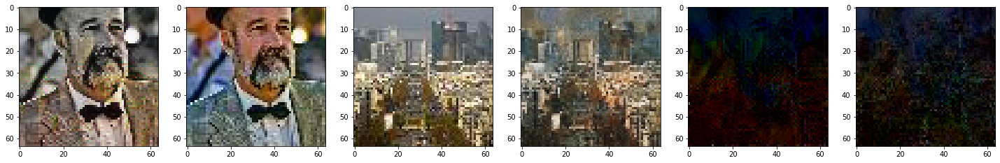

140it [01:25,  1.73it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  2 Batch Id :  140
Train GLoss      :  1.153645634651184
Train CISim      :  0.23007270693778992
Train GL         :  0.5521487593650818
Train reconLoss  :  0.37142419815063477
Train DLoss :  0.3962884843349457
StegImage Shape :  0.9850397 0.028052218
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97765803 0.053608302


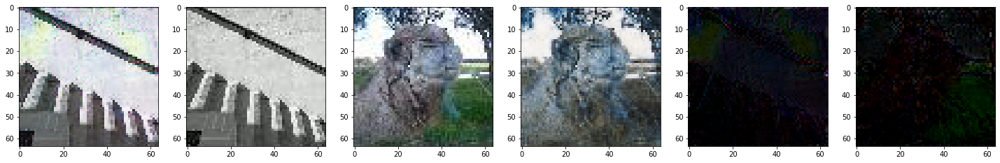

157it [01:35,  1.65it/s]



Epoch No. : 2 

Training Loss Generator : 1.08402 
Training Loss Discriminator : 0.47414 


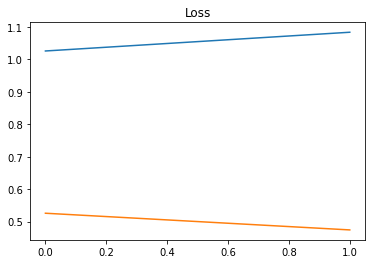


Validation loss decreased : 0.59038061 ===> 0.31247550
Saving Model!
Training


0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  3 Batch Id :  0
Train GLoss      :  1.0578210353851318
Train CISim      :  0.16990762948989868
Train GL         :  0.5341262817382812
Train reconLoss  :  0.3537870943546295
Train DLoss :  0.42641738057136536
StegImage Shape :  0.9987503 0.007357934
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9705868 0.012225366


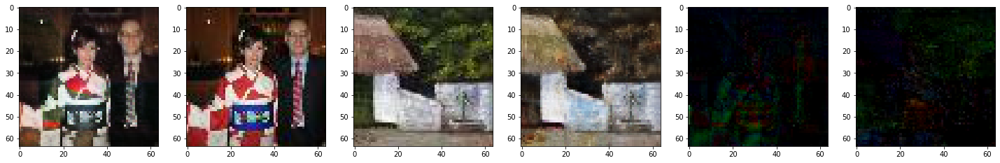

20it [00:12,  1.72it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  3 Batch Id :  20
Train GLoss      :  0.8690659999847412
Train CISim      :  0.1902373880147934
Train GL         :  0.33024144172668457
Train reconLoss  :  0.34858715534210205
Train DLoss :  0.3612351715564728
StegImage Shape :  0.9844878 0.008157586
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9728549 0.05775234


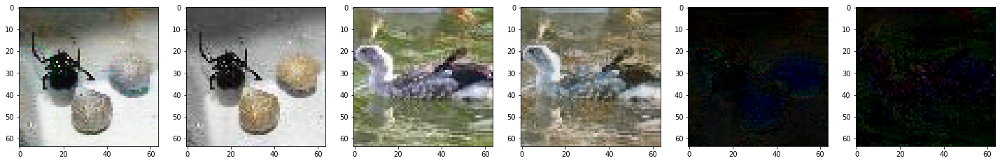

40it [00:24,  1.71it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  3 Batch Id :  40
Train GLoss      :  1.2101420164108276
Train CISim      :  0.2307625710964203
Train GL         :  0.6007278561592102
Train reconLoss  :  0.37865155935287476
Train DLoss :  0.3849177658557892
StegImage Shape :  0.98954916 0.011607271
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.99230814 0.046689935


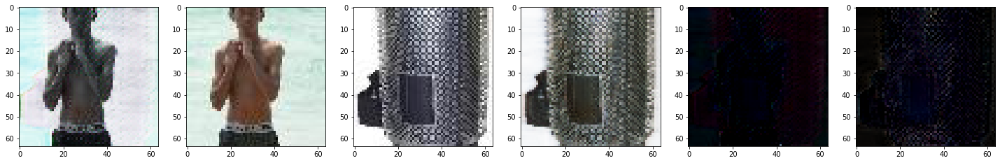

60it [00:36,  1.71it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  3 Batch Id :  60
Train GLoss      :  1.134177327156067
Train CISim      :  0.17515064775943756
Train GL         :  0.5984316468238831
Train reconLoss  :  0.3605949878692627
Train DLoss :  0.43662434816360474
StegImage Shape :  0.9554045 0.003714754
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.95985866 0.01144298


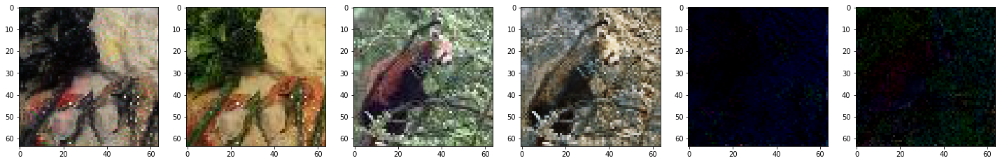

80it [00:49,  1.70it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  3 Batch Id :  80
Train GLoss      :  0.6193161010742188
Train CISim      :  0.2233772724866867
Train GL         :  0.015591182745993137
Train reconLoss  :  0.3803476393222809
Train DLoss :  0.7910146713256836
StegImage Shape :  0.9948579 0.0042366986
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98520607 0.011798068


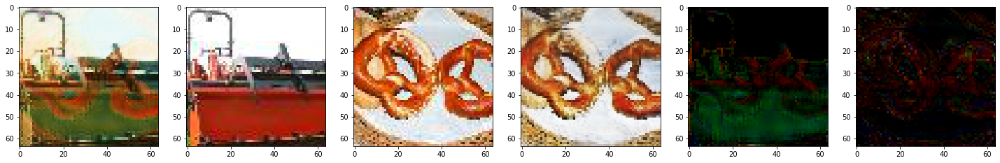

100it [01:01,  1.70it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  3 Batch Id :  100
Train GLoss      :  1.1554983854293823
Train CISim      :  0.2727578580379486
Train GL         :  0.5136521458625793
Train reconLoss  :  0.36908838152885437
Train DLoss :  0.40165889263153076
StegImage Shape :  0.9731451 0.0050352477
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96068037 0.028935557


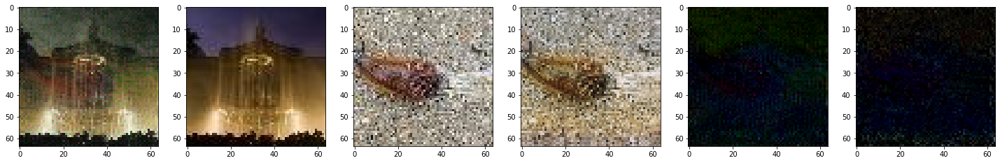

120it [01:14,  1.70it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  3 Batch Id :  120
Train GLoss      :  0.8020949363708496
Train CISim      :  0.17343319952487946
Train GL         :  0.2565225660800934
Train reconLoss  :  0.37213918566703796
Train DLoss :  0.4223068952560425
StegImage Shape :  0.9904901 0.0050841216
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.93069166 0.030369317


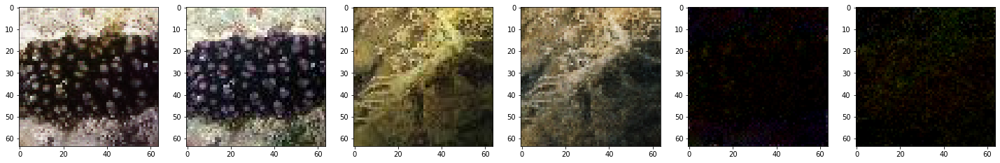

140it [01:26,  1.70it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  3 Batch Id :  140
Train GLoss      :  1.351813793182373
Train CISim      :  0.16166812181472778
Train GL         :  0.8090829253196716
Train reconLoss  :  0.381062775850296
Train DLoss :  0.5383555889129639
StegImage Shape :  0.9855943 0.011250077
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.95595026 0.019993406


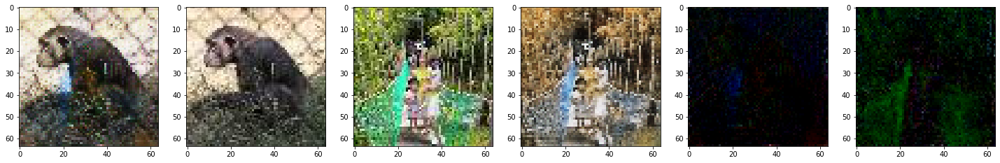

157it [01:36,  1.62it/s]



Epoch No. : 3 

Training Loss Generator : 1.07207 
Training Loss Discriminator : 0.47261 


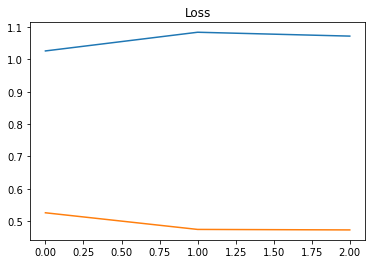

Training


0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  4 Batch Id :  0
Train GLoss      :  1.3884767293930054
Train CISim      :  0.1680380254983902
Train GL         :  0.47643381357192993
Train reconLoss  :  0.7440048456192017
Train DLoss :  0.5772387385368347
StegImage Shape :  0.99239093 0.006364748
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9516313 0.025659433


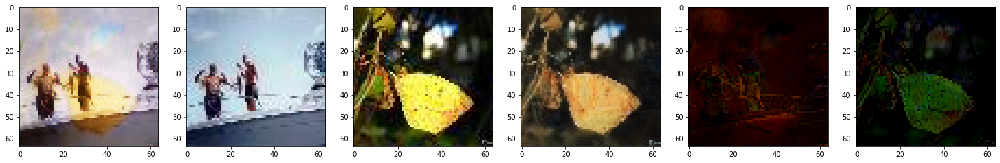

20it [00:12,  1.69it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  4 Batch Id :  20
Train GLoss      :  1.0146650075912476
Train CISim      :  0.19978804886341095
Train GL         :  0.41113701462745667
Train reconLoss  :  0.40373992919921875
Train DLoss :  0.3587070107460022
StegImage Shape :  0.9798116 0.02128682
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.8770131 0.023833318


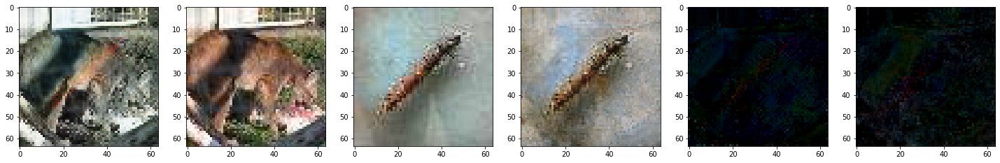

40it [00:24,  1.68it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  4 Batch Id :  40
Train GLoss      :  0.6158257126808167
Train CISim      :  0.14368540048599243
Train GL         :  0.13134212791919708
Train reconLoss  :  0.34079819917678833
Train DLoss :  0.5649430751800537
StegImage Shape :  0.9746983 0.00028265393
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98583764 0.02077695


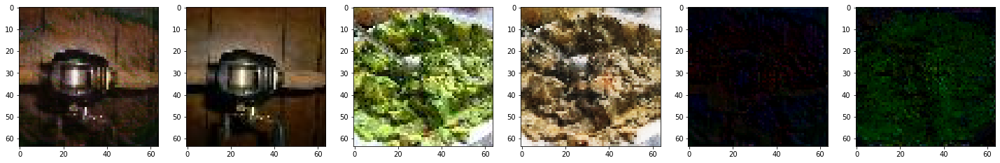

60it [00:37,  1.68it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  4 Batch Id :  60
Train GLoss      :  1.0183159112930298
Train CISim      :  0.18101796507835388
Train GL         :  0.44314345717430115
Train reconLoss  :  0.39415445923805237
Train DLoss :  0.4051108956336975
StegImage Shape :  0.9912751 0.0022113747
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.92999524 0.036770064


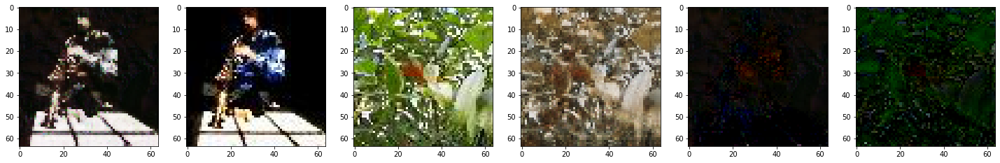

80it [00:50,  1.68it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  4 Batch Id :  80
Train GLoss      :  1.2504879236221313
Train CISim      :  0.21696850657463074
Train GL         :  0.6359318494796753
Train reconLoss  :  0.39758753776550293
Train DLoss :  0.3232611417770386
StegImage Shape :  0.9701356 0.011580906
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9889853 0.013111049


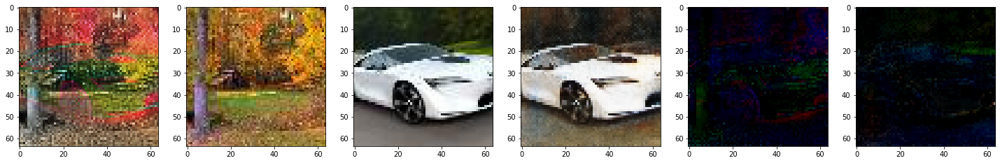

100it [01:02,  1.68it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  4 Batch Id :  100
Train GLoss      :  1.1936691999435425
Train CISim      :  0.20359329879283905
Train GL         :  0.6397227048873901
Train reconLoss  :  0.35035327076911926
Train DLoss :  0.3108784556388855
StegImage Shape :  0.9971648 0.0017538522
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9768861 0.018913975


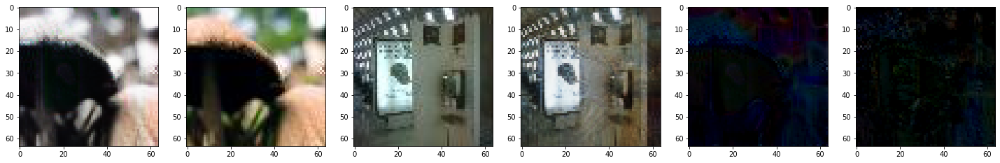

120it [01:15,  1.69it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  4 Batch Id :  120
Train GLoss      :  1.0227264165878296
Train CISim      :  0.1815725564956665
Train GL         :  0.444902628660202
Train reconLoss  :  0.39625126123428345
Train DLoss :  0.3376842439174652
StegImage Shape :  0.9496781 0.0025261429
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.963465 0.020716997


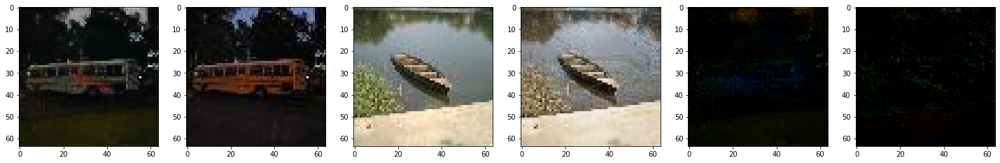

140it [01:27,  1.69it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  4 Batch Id :  140
Train GLoss      :  1.3461167812347412
Train CISim      :  0.13120631873607635
Train GL         :  0.5649783611297607
Train reconLoss  :  0.6499322056770325
Train DLoss :  0.6914077401161194
StegImage Shape :  0.9609868 0.011149979
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.93838614 0.018824507


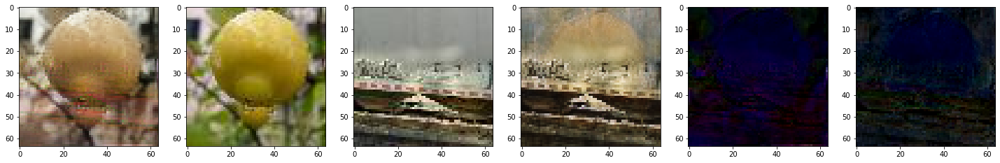

157it [01:38,  1.60it/s]



Epoch No. : 4 

Training Loss Generator : 1.11225 
Training Loss Discriminator : 0.44525 


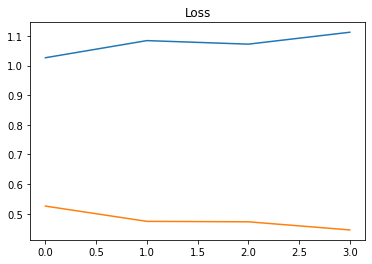

Training


0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  5 Batch Id :  0
Train GLoss      :  0.5382406711578369
Train CISim      :  0.1811290979385376
Train GL         :  0.0015850872732698917
Train reconLoss  :  0.35552647709846497
Train DLoss :  0.9835903644561768
StegImage Shape :  0.9723691 0.0009899475
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9716997 0.026288997


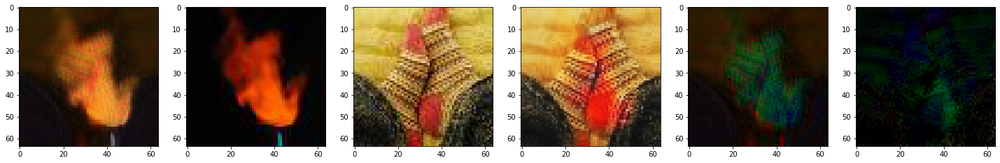

20it [00:12,  1.67it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  5 Batch Id :  20
Train GLoss      :  1.298494815826416
Train CISim      :  0.19370037317276
Train GL         :  0.7157423496246338
Train reconLoss  :  0.38905221223831177
Train DLoss :  0.4432254433631897
StegImage Shape :  0.98390645 0.019713473
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97208124 0.032083552


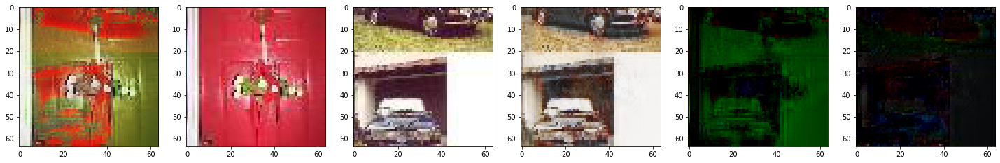

40it [00:25,  1.67it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  5 Batch Id :  40
Train GLoss      :  1.2480369806289673
Train CISim      :  0.19318655133247375
Train GL         :  0.6235062479972839
Train reconLoss  :  0.4313441812992096
Train DLoss :  0.3128744065761566
StegImage Shape :  0.99349123 0.0094161285
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9952153 0.027294567


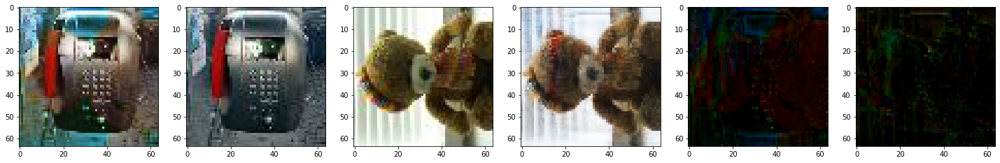

60it [00:37,  1.68it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  5 Batch Id :  60
Train GLoss      :  1.1143784523010254
Train CISim      :  0.1966923326253891
Train GL         :  0.5705745220184326
Train reconLoss  :  0.3471115529537201
Train DLoss :  0.3012083172798157
StegImage Shape :  0.9883289 0.006685271
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97838265 0.008490106


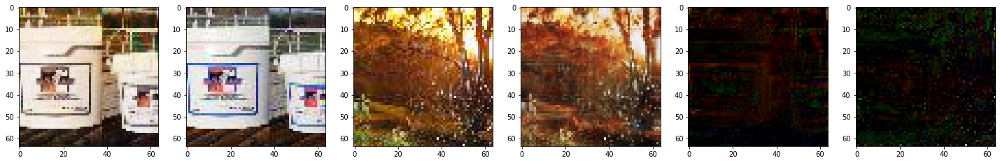

80it [00:50,  1.68it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  5 Batch Id :  80
Train GLoss      :  1.1263575553894043
Train CISim      :  0.1591981053352356
Train GL         :  0.5846496820449829
Train reconLoss  :  0.38250967860221863
Train DLoss :  0.3697028160095215
StegImage Shape :  0.9927028 0.021497544
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9396119 0.03082208


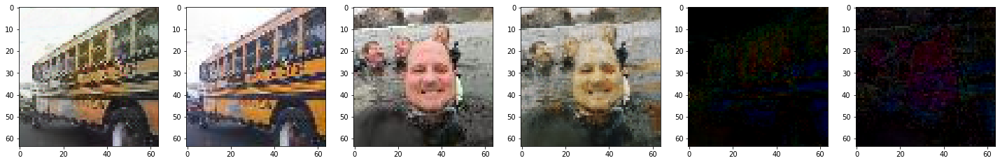

100it [01:03,  1.67it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  5 Batch Id :  100
Train GLoss      :  0.9369040727615356
Train CISim      :  0.20216238498687744
Train GL         :  0.06943248957395554
Train reconLoss  :  0.6653091907501221
Train DLoss :  0.7029299139976501
StegImage Shape :  0.9857382 0.020263437
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9338456 0.021197822


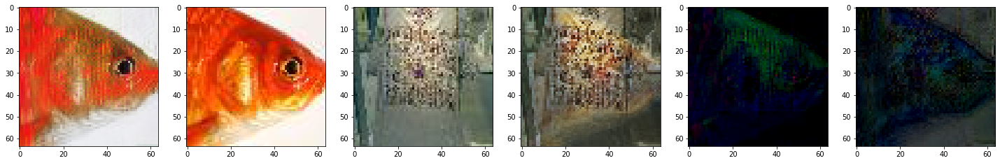

120it [01:15,  1.67it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  5 Batch Id :  120
Train GLoss      :  1.052232027053833
Train CISim      :  0.3178130090236664
Train GL         :  0.2440394163131714
Train reconLoss  :  0.49037954211235046
Train DLoss :  0.48326653242111206
StegImage Shape :  1.0 0.003976929
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9375891 0.014992184


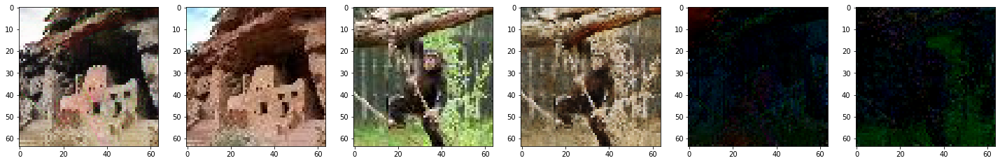

140it [01:28,  1.67it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  5 Batch Id :  140
Train GLoss      :  0.8749412298202515
Train CISim      :  0.20046642422676086
Train GL         :  0.13421371579170227
Train reconLoss  :  0.5402611494064331
Train DLoss :  0.4329855442047119
StegImage Shape :  0.97939676 0.0058971704
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9274301 0.022998307


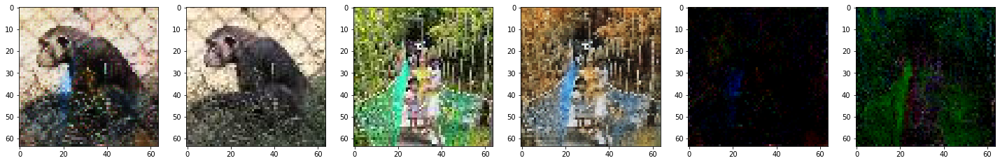

157it [01:38,  1.59it/s]



Epoch No. : 5 

Training Loss Generator : 1.02714 
Training Loss Discriminator : 0.50937 


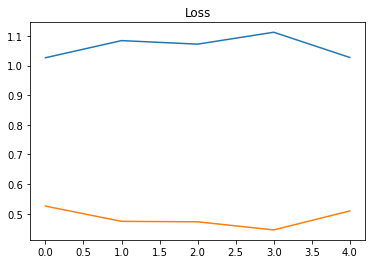

Training


0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  6 Batch Id :  0
Train GLoss      :  0.9422563910484314
Train CISim      :  0.1985028237104416
Train GL         :  0.3386683464050293
Train reconLoss  :  0.4050852060317993
Train DLoss :  0.4457941949367523
StegImage Shape :  0.9659506 0.016656732
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9304145 0.013463942


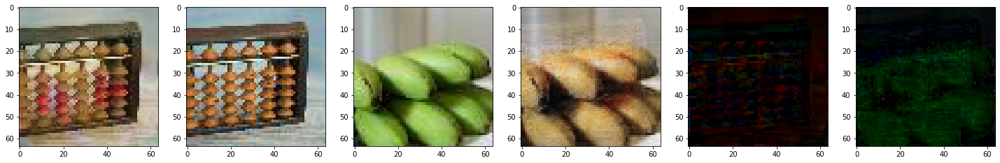

20it [00:12,  1.67it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  6 Batch Id :  20
Train GLoss      :  1.423479437828064
Train CISim      :  0.24496181309223175
Train GL         :  0.7175439596176147
Train reconLoss  :  0.4609736204147339
Train DLoss :  0.42490118741989136
StegImage Shape :  0.9945913 0.009156936
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94408345 0.02800957


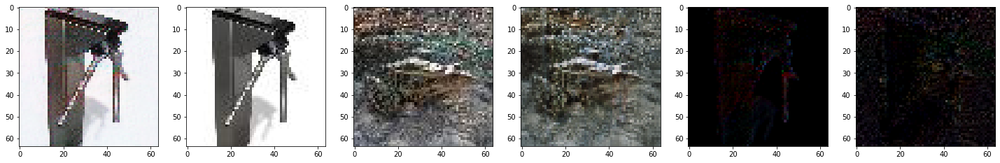

40it [00:25,  1.68it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  6 Batch Id :  40
Train GLoss      :  1.0873193740844727
Train CISim      :  0.16478699445724487
Train GL         :  0.5290089845657349
Train reconLoss  :  0.39352336525917053
Train DLoss :  0.29302099347114563
StegImage Shape :  0.9806067 0.01283661
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9340478 0.024362115


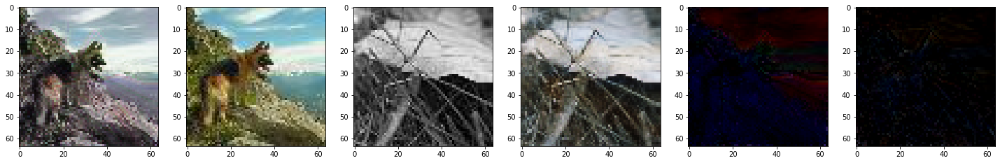

60it [00:37,  1.67it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch :  6 Batch Id :  60
Train GLoss      :  0.7470540404319763
Train CISim      :  0.2145754098892212
Train GL         :  0.12100783735513687
Train reconLoss  :  0.41147077083587646
Train DLoss :  0.7697902321815491
StegImage Shape :  0.9757401 0.021098074
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9961635 0.04164012


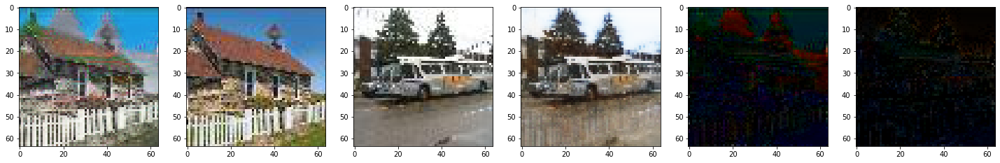

65it [00:41,  1.55it/s]


KeyboardInterrupt: ignored

In [ ]:
lowestValLoss = float("inf")
NUM_EPOCHS = 400
minValidLoss = np.Inf   # track change in validation loss

RUN = "1_11-20"

genLossEpoch = []
disLossEpoch = []

for epoch in range(1,NUM_EPOCHS+1):
    
    I1_reals = 0
    I1_fakes = 0

    # Train Model
    print("=" * 50)
    print("Training")
    generator.train()
    discriminator.train()

    
    for batch_idx, (img1, img2) in tqdm(enumerate(trainLoader)):       
        
        if train_on_gpu:
            img1 = img1.to(device)
            img2 = img2.to(device)

        img1Tan = ((2 * ((img1 - img1.min()) / (img1.max() - img1.min())) ) - 1)
        img2Tan = ((2 * ((img2 - img2.min()) / (img2.max() - img2.min())) ) - 1)
            
        stegImage, reconstructed = generator(img1, img2)
        D_real = discriminator(img1Tan)
        D_real2 = discriminator(img2Tan)
        # stegImgSigmoid = stegImage.detach() 
        # stegImgSigmoid = ((stegImgSigmoid - stegImgSigmoid.min()) / (stegImgSigmoid.max() - stegImgSigmoid.min()))
        D_fake = discriminator(stegImage)

        D_real_loss = mse(D_real, torch.ones_like(D_real)) + bce(D_real2, torch.ones_like(D_real2))
        D_fake_loss = mse(D_fake, torch.zeros_like(D_fake))

        D_loss = D_real_loss + D_fake_loss
            
        opt_disc.zero_grad()
        D_loss.backward(retain_graph=True)
        opt_disc.step()
        
        # adversarial loss for both generators
        D_fake = discriminator(stegImage)
        GL = mse(D_fake, torch.ones_like(D_fake))
        coverImageSimLoss = mse(stegImage, img1Tan) * 5
        reconLoss = mse(reconstructed, img2) * 75

        G_loss = reconLoss + GL + coverImageSimLoss

        opt_gen.zero_grad()
        G_loss.backward()
        opt_gen.step()
                      
        
        dictTrain["GeneratorLoss"].append(G_loss.item())
        dictTrain["coverImageSimLoss"].append(coverImageSimLoss.item())
        dictTrain["GL"].append(GL.item())
        dictTrain["reconLoss"].append(reconLoss.item())
        
        dictTrain["DiscriminatorLoss"].append(D_loss.item())


        if batch_idx % 20 == 0:
            print("Epoch : ", epoch,"Batch Id : ", batch_idx)
            print("Train GLoss      : ", G_loss.item())
            print("Train CISim      : ", coverImageSimLoss.item())
            print("Train GL         : ", GL.item())
            print("Train reconLoss  : ", reconLoss.item())

            print("Train DLoss : ", D_loss.item())

            fig = plt.figure(figsize = (25, 25))
            ax1 = fig.add_subplot(1,6,1)
            stegImgSigmoid = stegImage.detach() 
            stegImgSigmoid = ((stegImgSigmoid - stegImgSigmoid.min()) / (stegImgSigmoid.max() - stegImgSigmoid.min()))
            showSteg = stegImgSigmoid[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
            print("StegImage Shape : ", showSteg.max(),  showSteg.min())
            ax1.imshow(showSteg)

            ax2 = fig.add_subplot(1,6,2)
            showImg1 = img1[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
            print("Image1 Shape : ", showImg1.max(),  showImg1.min())
            ax2.imshow(showImg1)

            ax3 = fig.add_subplot(1,6,3)
            showImg2 = img2[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
            print("Image2 Shape : ", showImg2.max(),  showImg2.min())
            ax3.imshow(showImg2)

            ax4 = fig.add_subplot(1,6,4)
            recon = reconstructed[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
            print("Image2 Shape : ", recon.max(),  recon.min())
            ax4.imshow(recon)

            
            ax5 = fig.add_subplot(1,6,5)
            maskStegCover = showSteg - showImg1
            ax5.imshow(maskStegCover)

            ax6 = fig.add_subplot(1,6,6)
            maskReconSecret = showImg2 - recon
            ax6.imshow(maskReconSecret)

            plt.show()

    
    
    # Print the train and validation loss statistic
    print("=================================================================================================== \n")
    print("Epoch No. : {} \n".format(epoch))

    print("Training Loss Generator : {:.5f} ".format(sum(dictTrain["GeneratorLoss"][-157:])/157))
    
    print("Training Loss Discriminator : {:.5f} ".format(sum(dictTrain["DiscriminatorLoss"][-157:])/157))
    
    genLossEpoch.append(sum(dictTrain["GeneratorLoss"][-157:])/157)
    disLossEpoch.append(sum(dictTrain["DiscriminatorLoss"][-157:])/157)

    plt.plot(np.arange(len(genLossEpoch)), genLossEpoch, label = "Generator Loss")
    plt.plot(np.arange(len(disLossEpoch)), disLossEpoch, label = "Discriminator Loss")
    plt.title("Loss")
    plt.show()

    with open("/content/drive/MyDrive/SecurityResearchResults/dictTrain.json", "w") as outfile:
        json.dump(dictTrain, outfile)

    if D_loss.item() < minValidLoss:

        print("\nValidation loss decreased : {:.8f} ===> {:.8f}".format(minValidLoss, D_loss.item()))
        print("Saving Model!")
        # save current model
        torch.save(generator.state_dict(), "/content/drive/MyDrive/SecurityResearchResults/generator.pt")
        torch.save(discriminator.state_dict(), "/content/drive/MyDrive/SecurityResearchResults/discriminator.pt")
        minValidLoss = D_loss.item()


    #print("\nLearning Rate ==> {:.5f}".format(optimizer.state_dict()['param_groups'][0]['lr']))
    
    

In [29]:
from math import log10, sqrt

def PSNR(original, compressed):

    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 1.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

from skimage.metrics import structural_similarity

def PSNRBatch(original, compressed):
    lis = []
    for i in range(0,original.shape[0]):
        recon = reconstructed[i,:,:,:].cpu().permute(2,1,0).detach().numpy()
        orgi = original[i,:,:,:].cpu().permute(2,1,0).detach().numpy()
        #print(orgi.shape, recon.shape)
        #print(PSNR(orgi[i], recon[i]))
        lis.append(PSNR(orgi[i], recon[i]))

    return lis

#s = ssim(imageA, imageB)

def SSIMBatch(original, compressed):
    lis = []
    for i in range(0,original.shape[0]):
        recon = reconstructed[i,:,:,:].cpu().permute(2,1,0).detach().numpy()
        orgi = original[i,:,:,:].cpu().permute(2,1,0).detach().numpy()
        #print(orgi.shape, recon.shape)
        #print(structural_similarity(orgi[i], recon[i], multichannel = True))
        lis.append(structural_similarity(orgi[i], recon[i], multichannel = True))

    return lis

## Training Results

0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9644506 0.004334514
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94360214 0.016070452


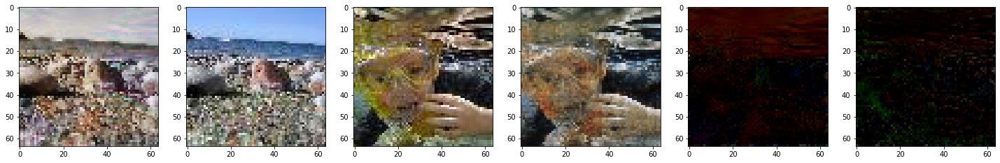

5it [00:01,  4.56it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.984271 0.013354792
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98914003 0.043829456


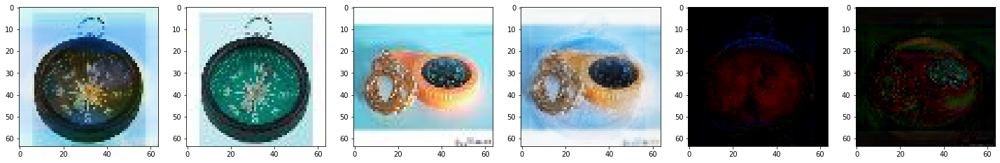

10it [00:02,  4.62it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9842815 0.001616764
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9659231 0.015087593


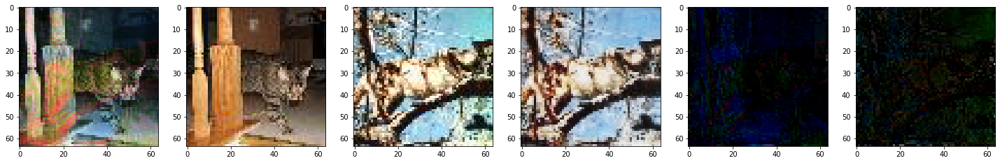

15it [00:04,  4.67it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.96428376 0.019750752
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.938063 0.035169505


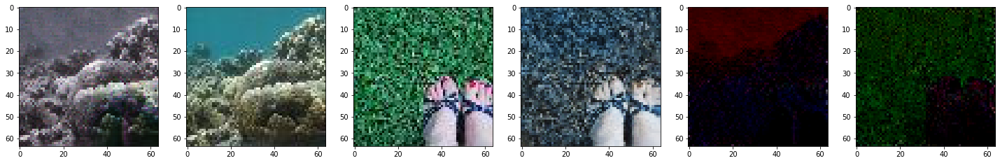

20it [00:05,  4.49it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  1.0 0.0044433605
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9751355 0.01389717


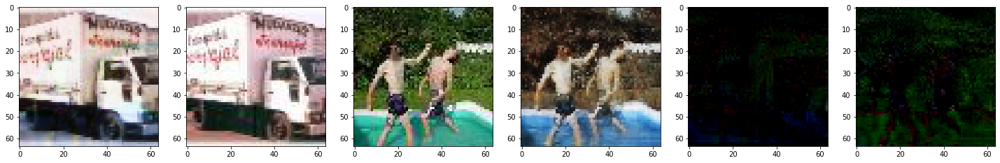

25it [00:07,  4.66it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97111785 0.003906722
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98248094 0.031545833


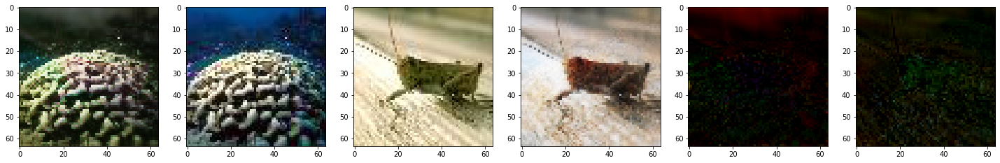

30it [00:08,  4.65it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.99525666 0.0063527445
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97381175 0.022025434


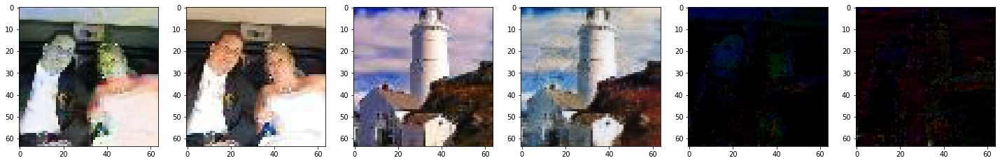

35it [00:10,  4.57it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9817433 0.001760878
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97127897 0.056336265


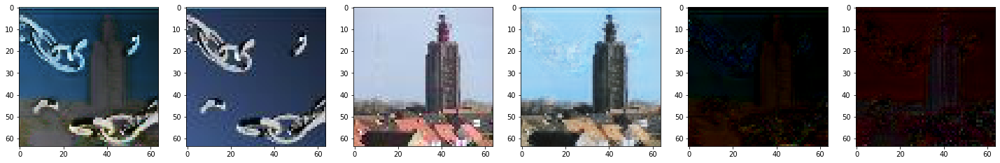

40it [00:11,  4.47it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.99236304 0.020162359
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9270087 0.015288433


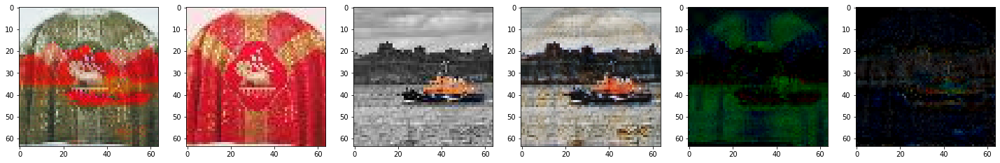

45it [00:12,  4.63it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9512986 0.0020541775
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9533937 0.018630588


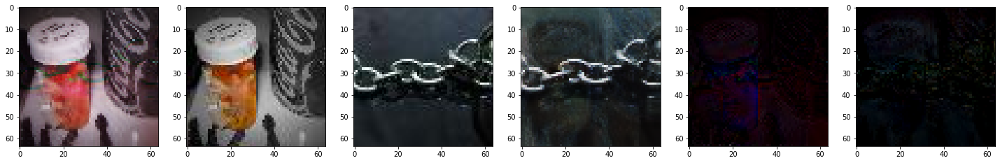

50it [00:14,  4.63it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9865901 0.0038403457
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9438375 0.016461603


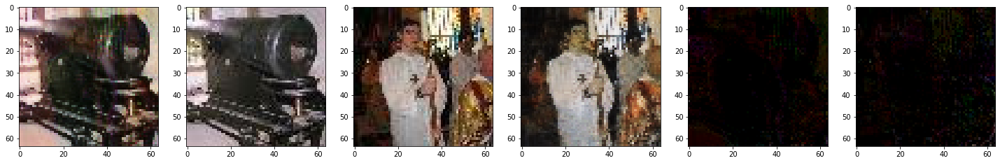

55it [00:15,  4.59it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.970234 0.010123902
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98744255 0.014184276


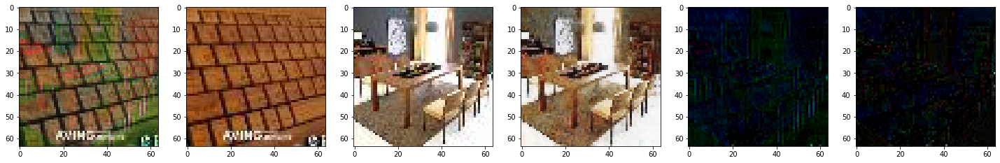

60it [00:17,  4.41it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9434054 0.020365244
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9439072 0.010882636


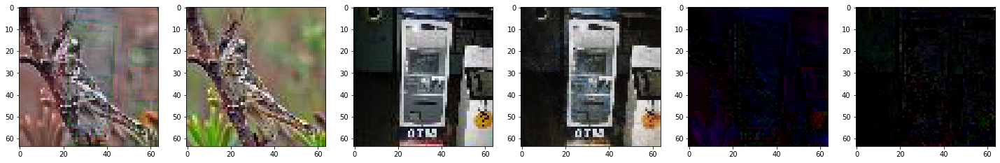

65it [00:18,  4.58it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  1.0 0.0014141897
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9731909 0.015833743


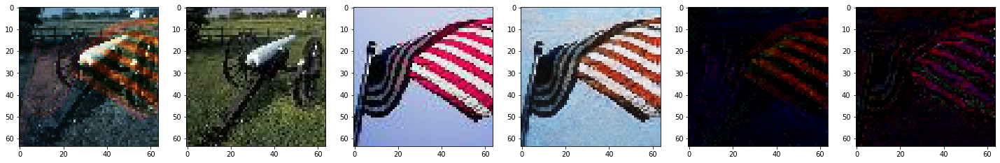

70it [00:20,  4.57it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98144984 0.0041886694
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9209189 0.008082957


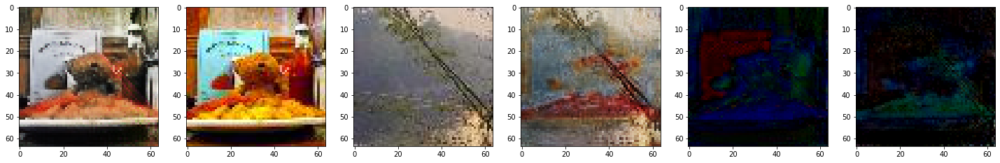

75it [00:21,  4.56it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.99697745 0.0018628545
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9601767 0.014701803


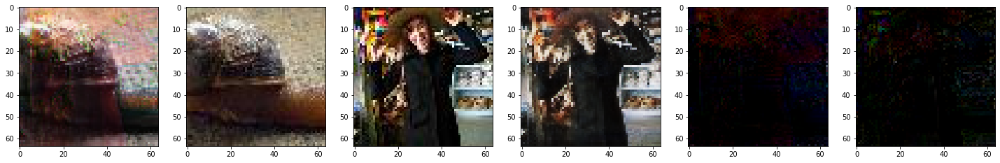

80it [00:23,  4.34it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98705065 0.020042619
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.91889983 0.06420421


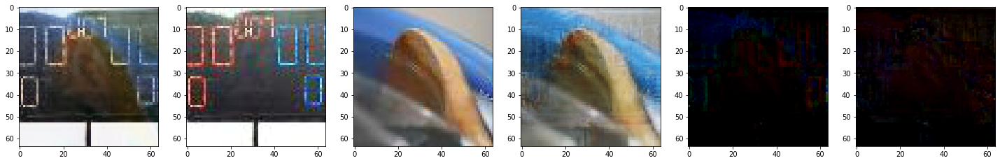

85it [00:24,  4.58it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  1.0 0.0050422554
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9854715 0.019110767


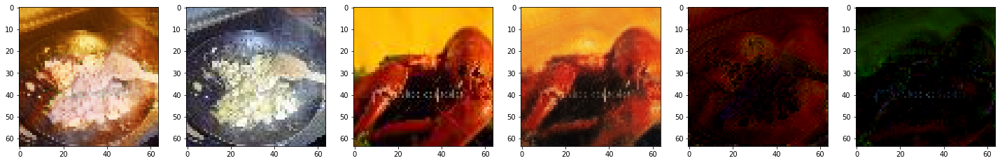

90it [00:26,  4.50it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9291024 0.009323108
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97479737 0.027577123


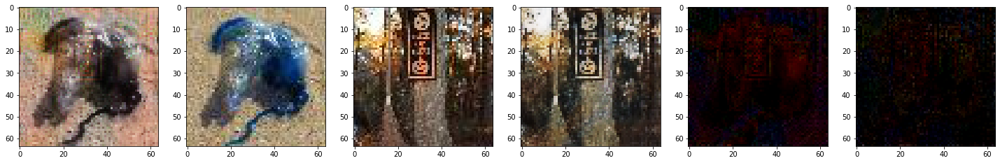

95it [00:27,  4.46it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9304965 0.044651557
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94223934 0.011411607


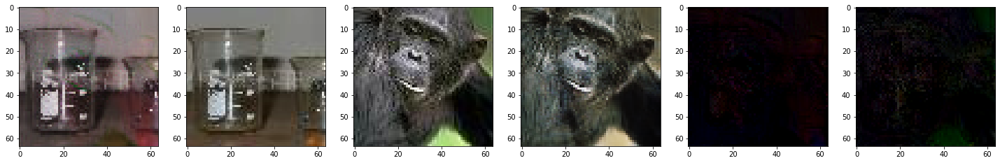

100it [00:29,  4.40it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98315847 0.0067347875
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96056145 0.011179232


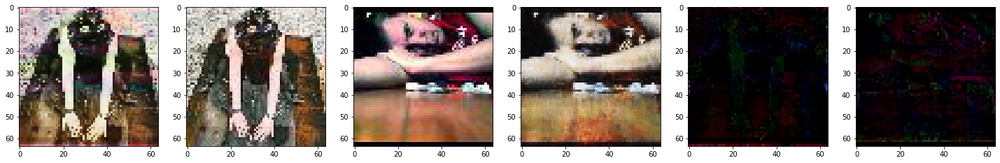

105it [00:30,  4.50it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9869093 0.010397187
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94397986 0.01851396


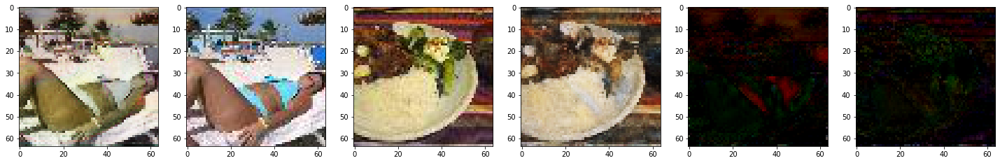

110it [00:32,  4.49it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97494936 0.0029493973
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96414965 0.014954958


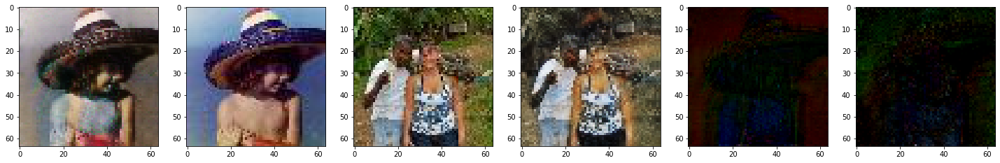

115it [00:33,  3.90it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9922599 0.004928648
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9777919 0.01222171


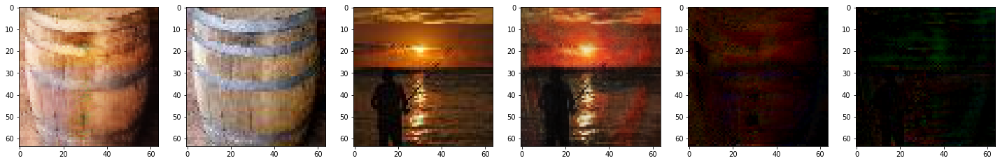

120it [00:35,  3.44it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.95993245 0.0137569625
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.93378323 0.041413397


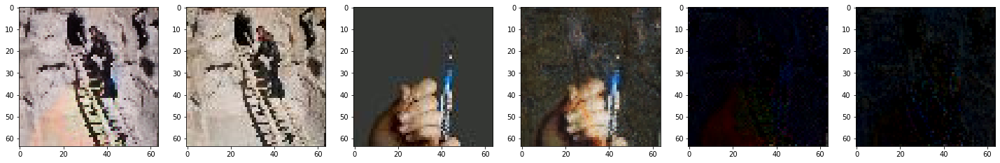

125it [00:37,  3.81it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.96124274 0.010623397
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9824348 0.07255953


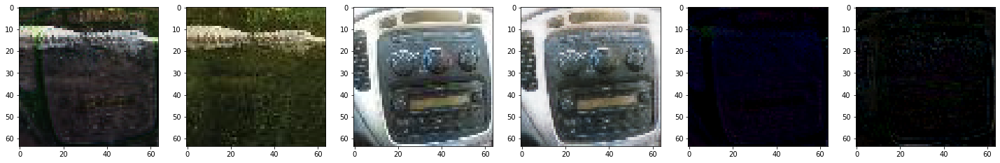

130it [00:40,  2.66it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97870594 0.0
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9514933 0.0049737743


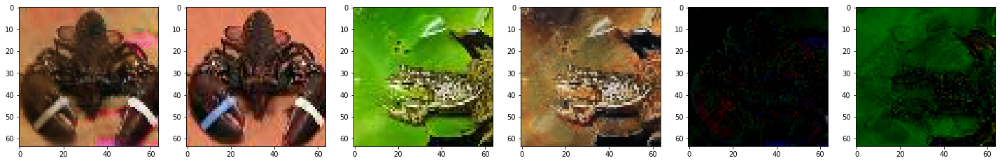

135it [00:41,  3.73it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97846615 0.0051336107
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9576581 0.013398406


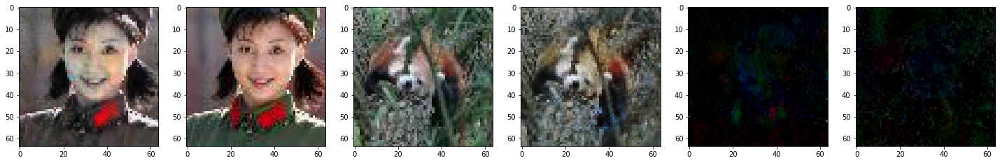

140it [00:43,  4.18it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9899821 0.00021773475
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98867106 0.017626347


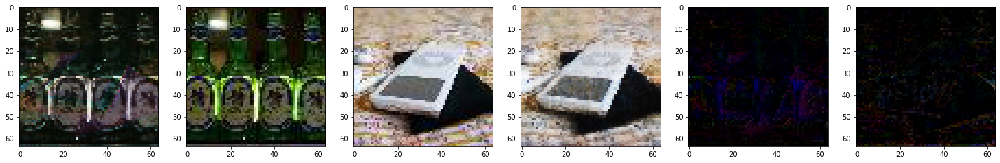

145it [00:44,  4.40it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9969639 0.002513718
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.963976 0.0096604945


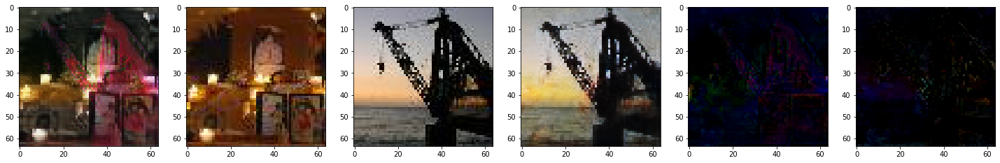

150it [00:46,  4.47it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9896812 0.0037028762
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9622295 0.017729513


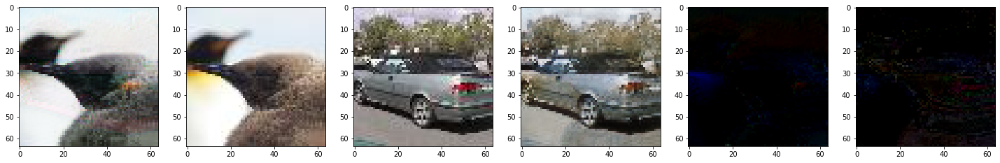

155it [00:47,  4.44it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.99280196 0.010898699
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9874653 0.017740171


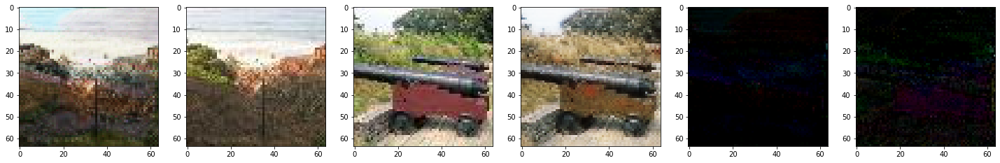

157it [00:48,  3.22it/s]

PSNR :  5000  ==>  24.170720397798583
SSIM :  5000  ==>  0.861692035940415


In [30]:
## TESTING 

generator.eval()
discriminator.eval()

psnr = []
ssim = []

for epoch in range(1,2):
    
    for batch_idx, (img1, img2) in tqdm(enumerate(trainLoader)):       
        with torch.no_grad():

          if train_on_gpu:
              img1 = img1.to(device)
              img2 = img2.to(device)

          img1Tan = ((2 * ((img1 - img1.min()) / (img1.max() - img1.min())) ) - 1)
          img2Tan = ((2 * ((img2 - img2.min()) / (img2.max() - img2.min())) ) - 1)
              
          stegImage, reconstructed = generator(img1, img2)

          psnr += PSNRBatch(img2, reconstructed)
          ssim += SSIMBatch(img2, reconstructed)


          if batch_idx % 5 == 0:

              fig = plt.figure(figsize = (25, 25))
              ax1 = fig.add_subplot(1,6,1)
              stegImgSigmoid = stegImage.detach() 
              stegImgSigmoid = ((stegImgSigmoid - stegImgSigmoid.min()) / (stegImgSigmoid.max() - stegImgSigmoid.min()))
              showSteg = stegImgSigmoid[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
              print("StegImage Shape : ", showSteg.max(),  showSteg.min())
              ax1.imshow(showSteg)

              ax2 = fig.add_subplot(1,6,2)
              showImg1 = img1[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
              print("Image1 Shape : ", showImg1.max(),  showImg1.min())
              ax2.imshow(showImg1)

              ax3 = fig.add_subplot(1,6,3)
              showImg2 = img2[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
              print("Image2 Shape : ", showImg2.max(),  showImg2.min())
              ax3.imshow(showImg2)

              ax4 = fig.add_subplot(1,6,4)
              recon = reconstructed[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
              print("Image2 Shape : ", recon.max(),  recon.min())
              ax4.imshow(recon)

              
              ax5 = fig.add_subplot(1,6,5)
              maskStegCover = showSteg - showImg1
              ax5.imshow(maskStegCover)

              ax6 = fig.add_subplot(1,6,6)
              maskReconSecret = showImg2 - recon
              ax6.imshow(maskReconSecret)

              plt.show()

print("PSNR : ", len(psnr), " ==> ", sum(psnr) / len(psnr))
print("SSIM : ", len(ssim), " ==> ", sum(ssim) / len(ssim))

## Testing Results

0it [00:00, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9109742 0.03926584
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98569787 0.023447858


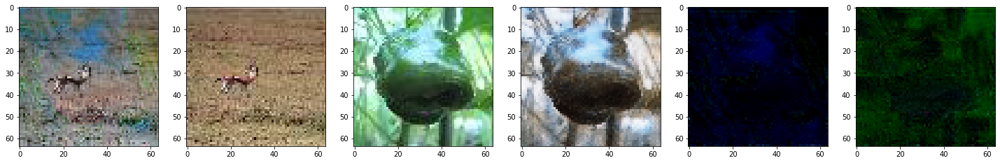

1it [00:00,  1.26it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9122222 0.033450354
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97550243 0.042123403


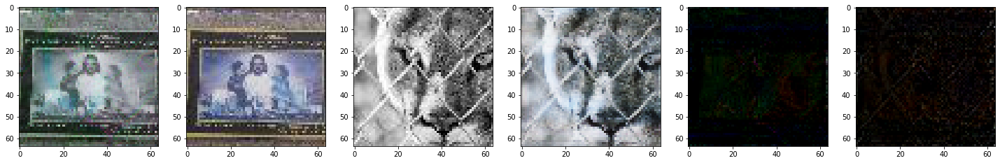

2it [00:01,  1.20it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98201466 0.012206936
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94438124 0.027270561


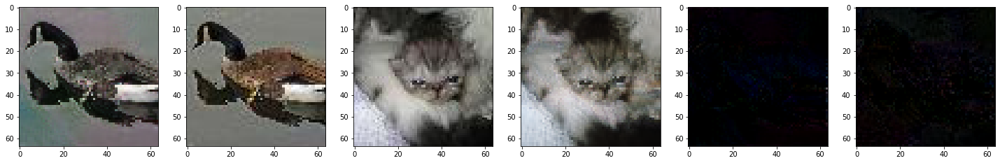

3it [00:02,  1.21it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9868568 0.052020896
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9771742 0.0044648875


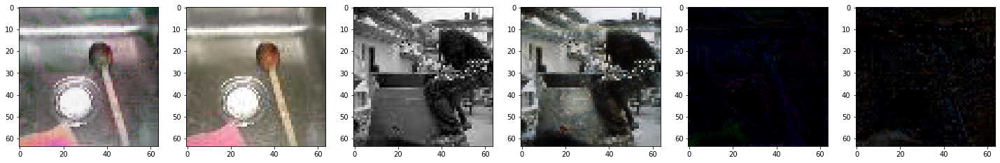

4it [00:03,  1.19it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9682041 0.0044186194
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96336204 0.061814096


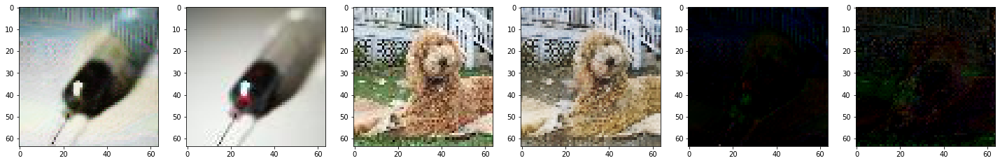

5it [00:04,  1.23it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9943471 0.0
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9718898 0.031206386


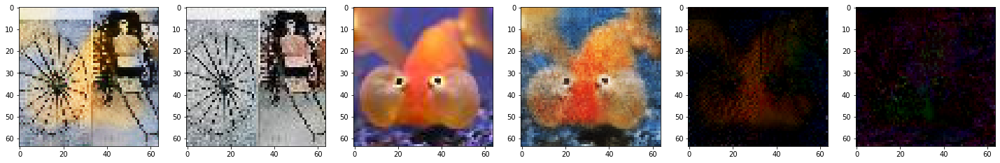

6it [00:04,  1.26it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9675994 0.0093638925
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94891447 0.04178896


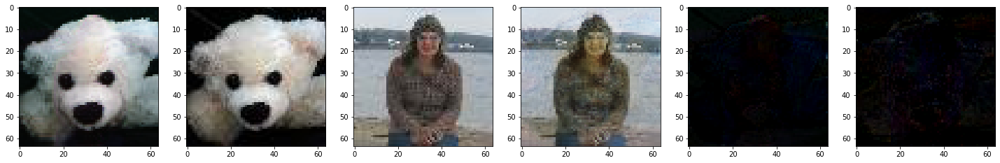

7it [00:05,  1.28it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.96002144 0.0053016865
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9560254 0.0280727


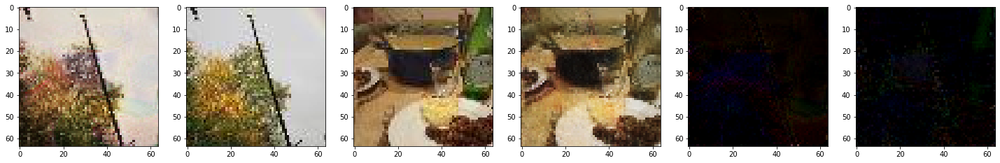

8it [00:06,  1.23it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.90079194 0.026043236
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.97769314 0.04773698


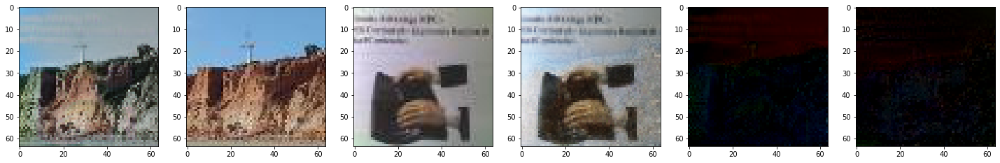

9it [00:07,  1.25it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.96063155 0.039817456
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9336023 0.02974418


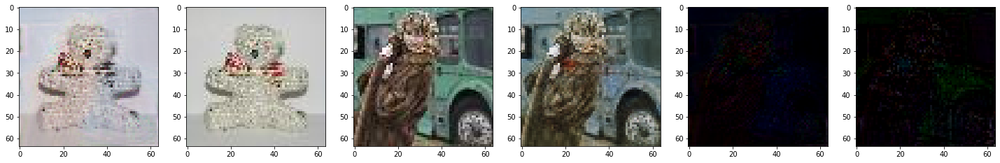

10it [00:08,  1.27it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9317137 0.0039890474
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94674045 0.012761638


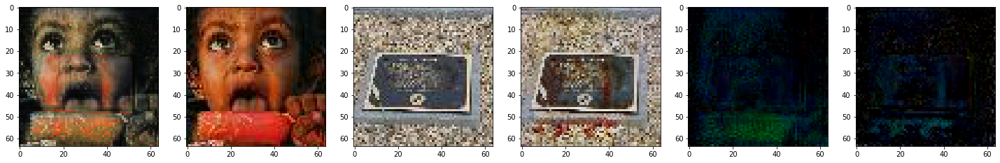

11it [00:08,  1.27it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9225876 0.004945029
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96632427 0.0145565085


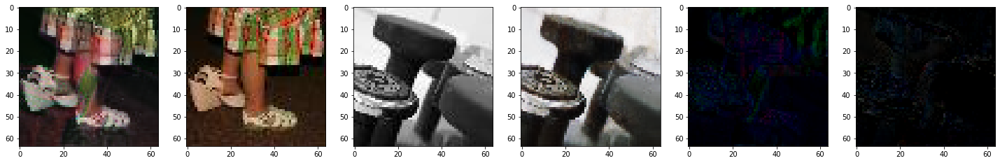

12it [00:09,  1.22it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97568655 0.0067773527
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9595339 0.01658557


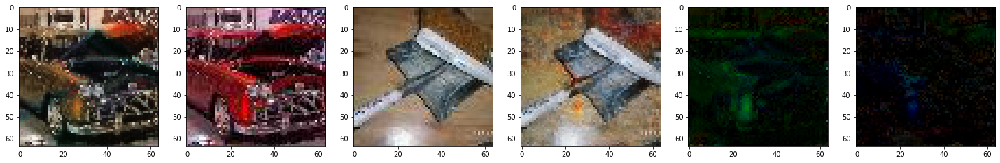

13it [00:10,  1.24it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9836724 0.0029245906
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.94394183 0.013349638


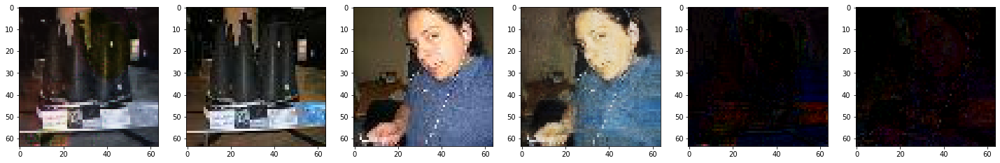

14it [00:11,  1.26it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97543585 0.01191822
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96999544 0.04263594


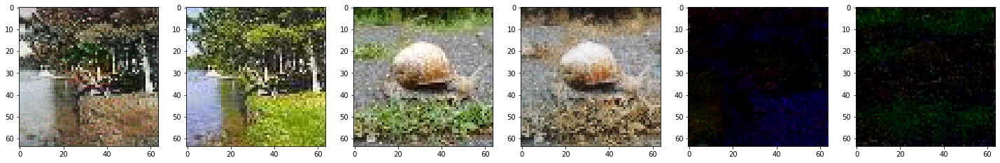

15it [00:12,  1.27it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97938305 0.04433435
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9747064 0.015964948


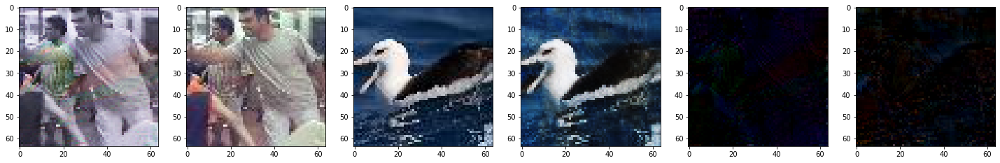

16it [00:12,  1.21it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9779977 0.003443832
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.98300076 0.045557242


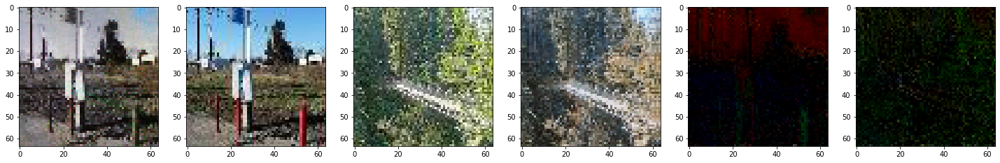

17it [00:13,  1.22it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9802216 0.0035020413
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9661908 0.0496929


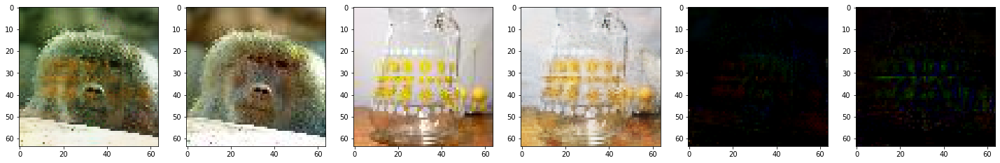

18it [00:15,  1.03it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97969955 0.022521278
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.95393664 0.03369921


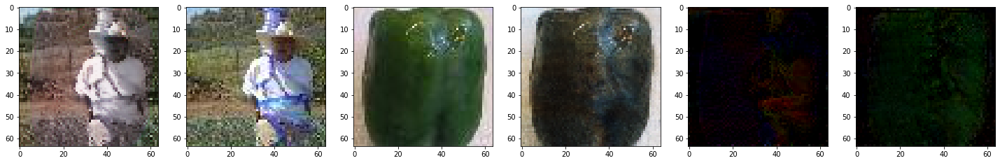

19it [00:16,  1.07s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98214287 0.008186875
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9323559 0.012831261


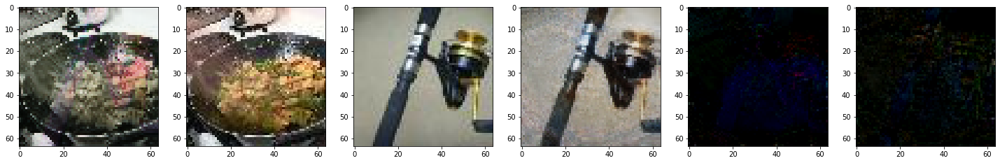

20it [00:17,  1.01s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9400349 0.0015493962
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9509699 0.030650696


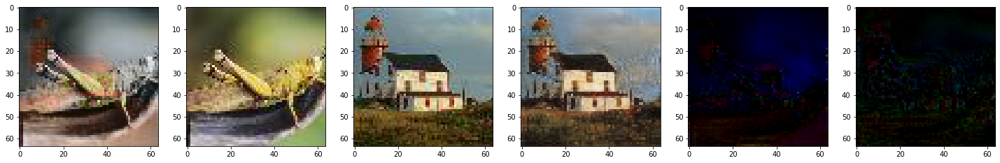

21it [00:18,  1.06it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  1.0 0.0010474718
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9727035 0.025762502


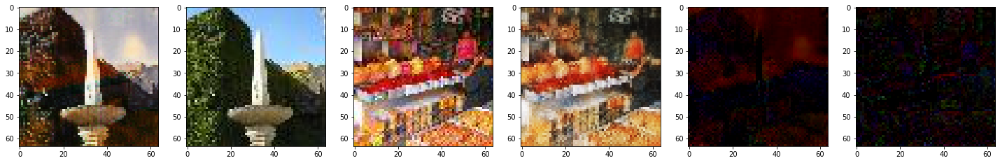

22it [00:18,  1.12it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98909533 0.005174222
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9660977 0.016155358


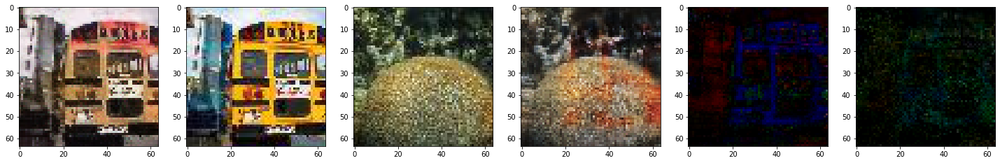

23it [00:19,  1.16it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9213948 0.009139151
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9590909 0.029570354


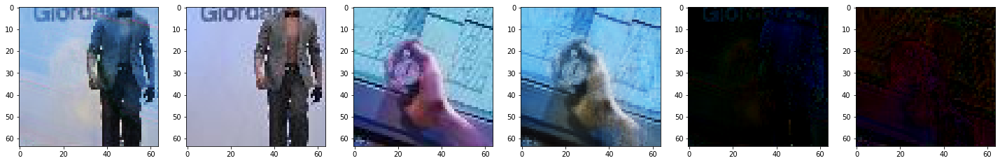

24it [00:20,  1.15it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98003286 0.040430833
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96417725 0.037492078


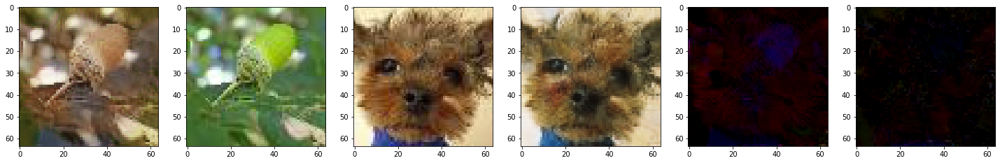

25it [00:21,  1.20it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.96566284 0.005892122
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9861602 0.026960272


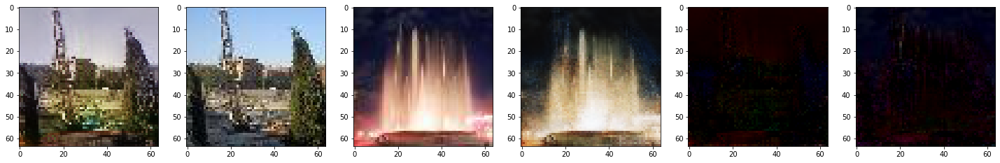

26it [00:22,  1.22it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9544978 0.01720602
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.90969217 0.037246745


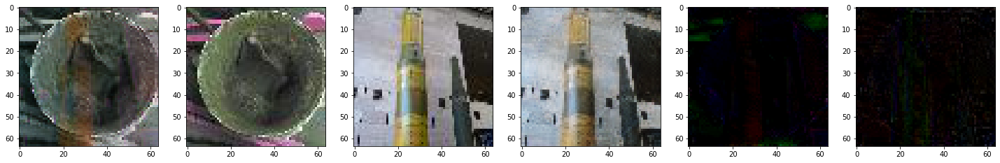

27it [00:22,  1.24it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97260714 0.004521564
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.91226643 0.015021696


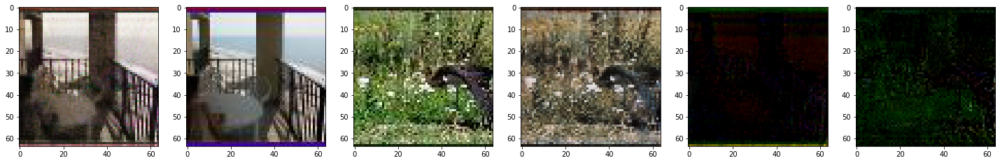

28it [00:23,  1.19it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9542269 0.0019817634
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.93679994 0.020584296


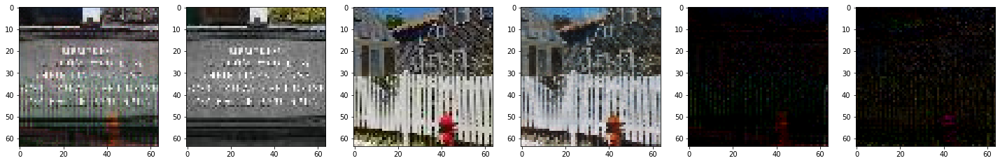

29it [00:24,  1.22it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.91040933 0.007899524
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9424807 0.02853836


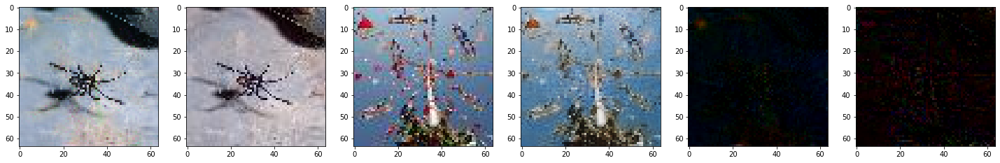

30it [00:25,  1.24it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98360384 0.009849881
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.932835 0.011996652


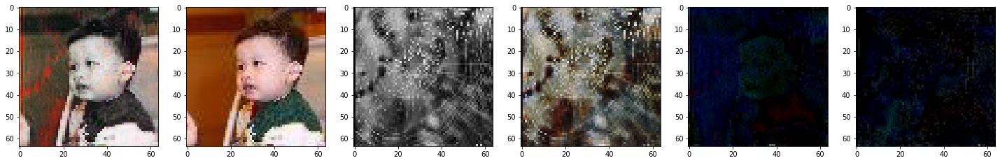

31it [00:26,  1.25it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.96376526 0.009996414
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9574939 0.021073978


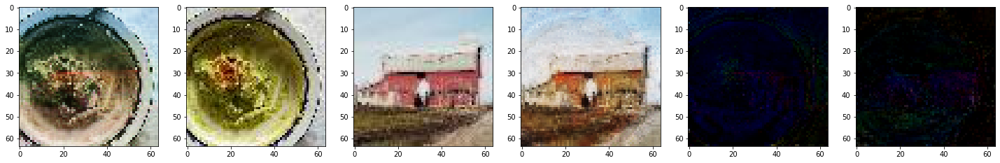

32it [00:26,  1.20it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9829219 0.053523675
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.88551176 0.048112545


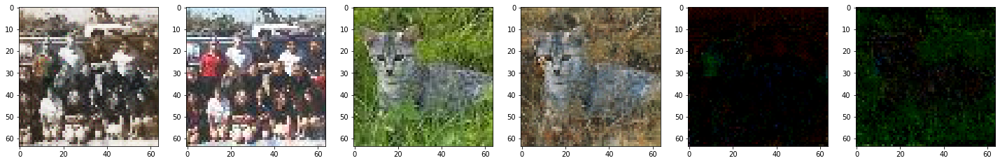

33it [00:27,  1.22it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9229797 0.020585828
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9822918 0.013228821


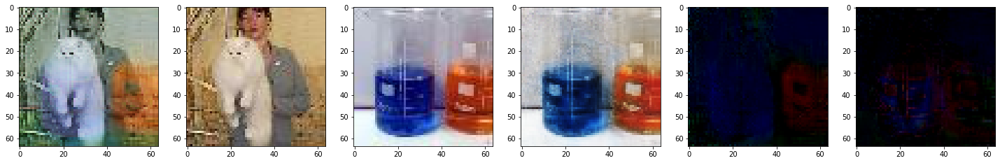

34it [00:28,  1.23it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.989603 0.0113908285
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9765326 0.027029356


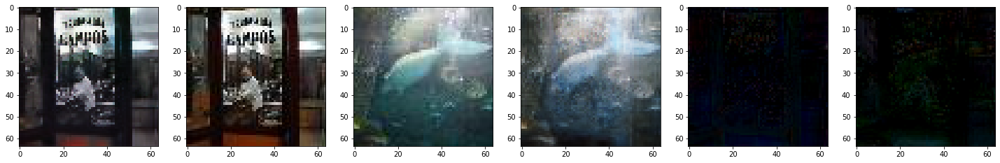

35it [00:29,  1.24it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9785321 0.00418321
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9814699 0.024174124


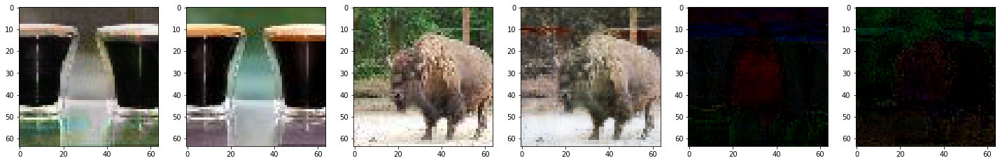

36it [00:30,  1.20it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.97436893 0.025869401
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9442085 0.022179093


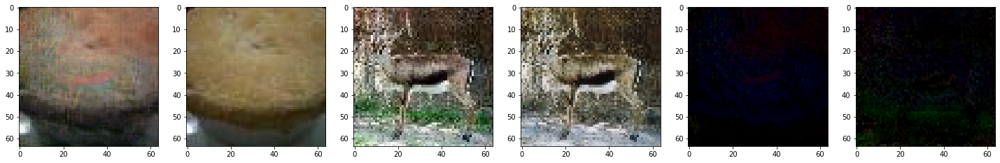

37it [00:31,  1.21it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9964503 0.0
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.96244013 0.016197812


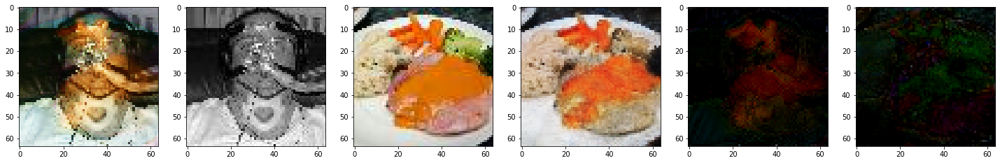

38it [00:31,  1.22it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.98394173 0.013339477
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9876423 0.021848205


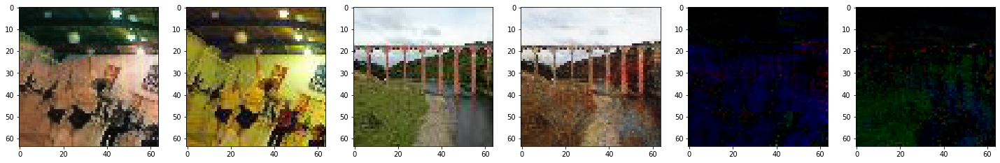

39it [00:32,  1.22it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9951017 0.059782404
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9755037 0.0031644145


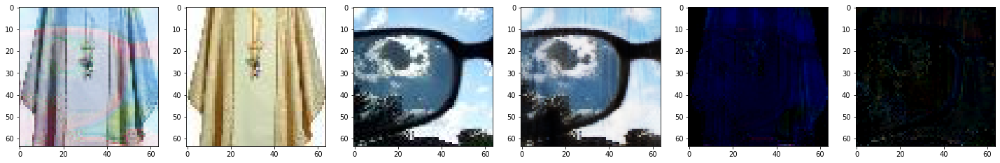

40it [00:33,  1.17it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


StegImage Shape :  0.9970576 0.0014397437
Image1 Shape :  1.0 0.0
Image2 Shape :  1.0 0.0
Image2 Shape :  0.9514648 0.0042944243


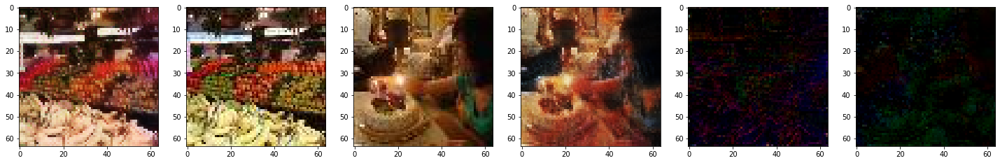

41it [00:34,  1.19it/s]

PSNR :  1300  ==>  23.990335575799964
SSIM :  1300  ==>  0.8608663006166389


In [31]:
## TESTING 

generator.eval()
discriminator.eval()

psnr = []
ssim = []

for epoch in range(1,2):
    
    for batch_idx, (img1, img2) in tqdm(enumerate(valLoader)):       
        with torch.no_grad():

          if train_on_gpu:
              img1 = img1.to(device)
              img2 = img2.to(device)

          img1Tan = ((2 * ((img1 - img1.min()) / (img1.max() - img1.min())) ) - 1)
          img2Tan = ((2 * ((img2 - img2.min()) / (img2.max() - img2.min())) ) - 1)
              
          stegImage, reconstructed = generator(img1, img2)

          psnr += PSNRBatch(img2, reconstructed)
          ssim += SSIMBatch(img2, reconstructed)


          if batch_idx % 1 == 0:

              fig = plt.figure(figsize = (25, 25))
              ax1 = fig.add_subplot(1,6,1)
              stegImgSigmoid = stegImage.detach() 
              stegImgSigmoid = ((stegImgSigmoid - stegImgSigmoid.min()) / (stegImgSigmoid.max() - stegImgSigmoid.min()))
              showSteg = stegImgSigmoid[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
              print("StegImage Shape : ", showSteg.max(),  showSteg.min())
              ax1.imshow(showSteg)

              ax2 = fig.add_subplot(1,6,2)
              showImg1 = img1[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
              print("Image1 Shape : ", showImg1.max(),  showImg1.min())
              ax2.imshow(showImg1)

              ax3 = fig.add_subplot(1,6,3)
              showImg2 = img2[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
              print("Image2 Shape : ", showImg2.max(),  showImg2.min())
              ax3.imshow(showImg2)

              ax4 = fig.add_subplot(1,6,4)
              recon = reconstructed[0,:,:,:].cpu().permute(2,1,0).detach().numpy()
              print("Image2 Shape : ", recon.max(),  recon.min())
              ax4.imshow(recon)

              
              ax5 = fig.add_subplot(1,6,5)
              maskStegCover = showSteg - showImg1
              ax5.imshow(maskStegCover)

              ax6 = fig.add_subplot(1,6,6)
              maskReconSecret = showImg2 - recon
              ax6.imshow(maskReconSecret)

              plt.show()

print("PSNR : ", len(psnr), " ==> ", sum(psnr) / len(psnr))
print("SSIM : ", len(ssim), " ==> ", sum(ssim) / len(ssim))